In [1]:
from importlib import reload
import sys
import os
sys.path.insert(0, './../scripts')

In [2]:
import pickle
import numpy as np
import scipy
import torch
import matplotlib as mpl
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.figure import figaspect
import time

import base_network as base_net
import ring_network as network
import sim_util as su
import ricciardi as ric
import integrate as integ
import dmft

def imshowbar(fig,ax,A,**kwargs):
    imsh = ax.imshow(A,**kwargs)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(imsh, cax=cax, orientation='vertical')
    return cbar

# Simulate Best Fit

In [120]:
id = (133, 0, 52, 0)
# id = (133,0)
# id = None
if id is None:
    with open('./../results/best_fit.pkl', 'rb') as handle:
        res_dict = pickle.load(handle)
        fit_res_dict = res_dict.copy()
elif len(id)==2:
    with open('./../results/ring_results/results_ring_{:d}.pkl'.format(
            id[0]), 'rb') as handle:
        res_dict = pickle.load(handle)[id[-1]]
        fit_res_dict = res_dict.copy()
else:
    with open('./../results/ring_results/results_ring_perturb_njob-{:d}_nrep-{:d}_ntry-{:d}.pkl'.format(
            id[0],id[1],id[2]), 'rb') as handle:
        res_dict = pickle.load(handle)[id[-1]]
        fit_res_dict = res_dict.copy()
prms = res_dict['prms']
eX = res_dict['best_monk_eX']
bX = res_dict['best_monk_bX']
aXs = res_dict['best_monk_aXs']
K = prms['K']
SoriE = prms['SoriE']
SoriI = prms['SoriI']
SoriF = prms['SoriF']
J = prms['J']
beta = prms['beta']
gE = prms['gE']
gI = prms['gI']
hE = prms['hE']
hI = prms['hI']
L = prms['L']
CVL = prms['CVL']

ri = ric.Ricciardi()
ri.set_up_nonlinearity('./../scripts/phi_int')
ri.set_up_nonlinearity_tensor()

NtE = 50
Nt = NtE*ri.tE
dt = ri.tI/5
T = torch.linspace(0,8*Nt,round(8*Nt/dt)+1)
mask_time = T>(4*Nt)
T_mask = T.cpu().numpy()[mask_time]

N = 10000
Nori = 20
NE = 4*(N//Nori)//5
NI = 1*(N//Nori)//5

this_prms = prms.copy()
this_prms['Nori'] = Nori
this_prms['NE'] = NE
this_prms['NI'] = NI

Loading previously saved nonlinearity
Using cpu


In [121]:
prms

{'K': 500,
 'SoriE': 30.724128923653044,
 'SoriI': 32.01902451342836,
 'SoriF': 21.755331006307276,
 'J': 0.00013396138215968675,
 'beta': 0.17752765717773727,
 'gE': 7.520601544410895,
 'gI': 5.071686749419628,
 'hE': 3.470954453922598,
 'hI': 0.5059797681900788,
 'L': 2.6277970768478607,
 'CVL': 7.477261394334808}

In [10]:
reload(su)

start = time.process_time()

net,M,H,B,LAS,eps = su.gen_ring_disorder_tensor(0,this_prms,eX)

Inp = (bX*B+aXs[-1]*H)*eps

print("Generating disorder took ",time.process_time() - start," s")
print('')

# start = time.process_time()

# sol,_ = integ.sim_dyn_tensor(ri,T,0.0,M,Inp,LAS,net.C_conds[0],mult_tau=True)
# rates = torch.mean(sol[:,mask_time],axis=1).cpu().numpy()

# np.save('best_fit_vis_rates',rates)

# print("Integrating network took ",time.process_time() - start," s")
# print('')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
rates = np.load('best_fit_vis_rates.npy')

Using cpu
Generating disorder took  7.671424000000001  s



# Arrange Neurons

In [105]:
radEring = 25
radIring = 22
radEpop = 2
radIpop = 1

Nperori = N//Nori
pts = np.zeros((N,2))
pops = np.zeros(N).astype(int)
colors = [None,]*N

rng = np.random.default_rng(0)
for i in range(net.N):
    locidx = i//Nperori
    popidx = 0 if (i%Nperori) < net.NC[0] else 1
    pops[i] = popidx
    colors[i] = ['r','b'][popidx]
    
    r = np.sqrt(rng.random())
    tht = rng.random()*2*np.pi
    
    if popidx==0:
        pts[i,0] = radEring*np.cos(2*np.pi*(locidx-0.12)/Nori) + radEpop*r*np.cos(tht)
        pts[i,1] = radEring*np.sin(2*np.pi*(locidx-0.12)/Nori) + radEpop*r*np.sin(tht)
    else:
        pts[i,0] = radIring*np.cos(2*np.pi*(locidx+0.12)/Nori) + radIpop*r*np.cos(tht)
        pts[i,1] = radIring*np.sin(2*np.pi*(locidx+0.12)/Nori) + radIpop*r*np.sin(tht)

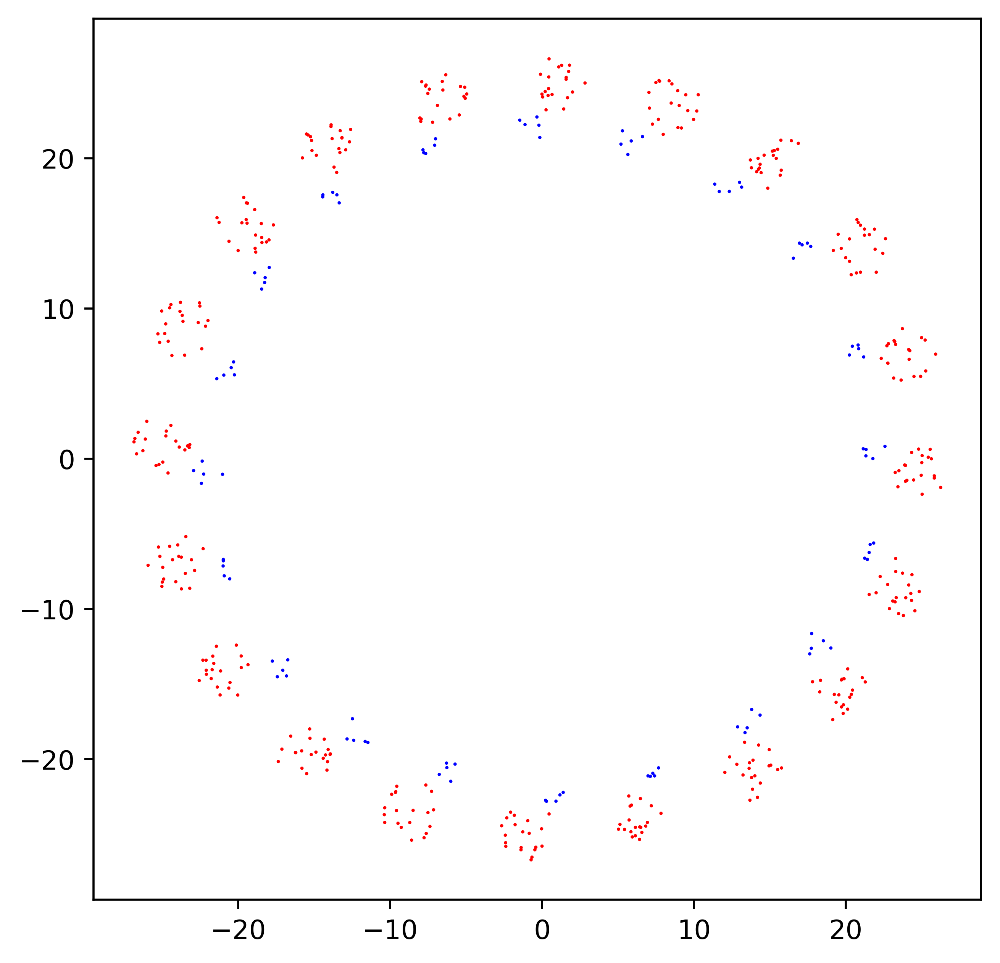

In [106]:
fig,axs = plt.subplots(1,1,figsize=(6,6),dpi=500)

skip = 20
s = 1
axs.scatter(pts[::skip,0],pts[::skip,1],s=s,lw=s/4,c=colors[::skip])

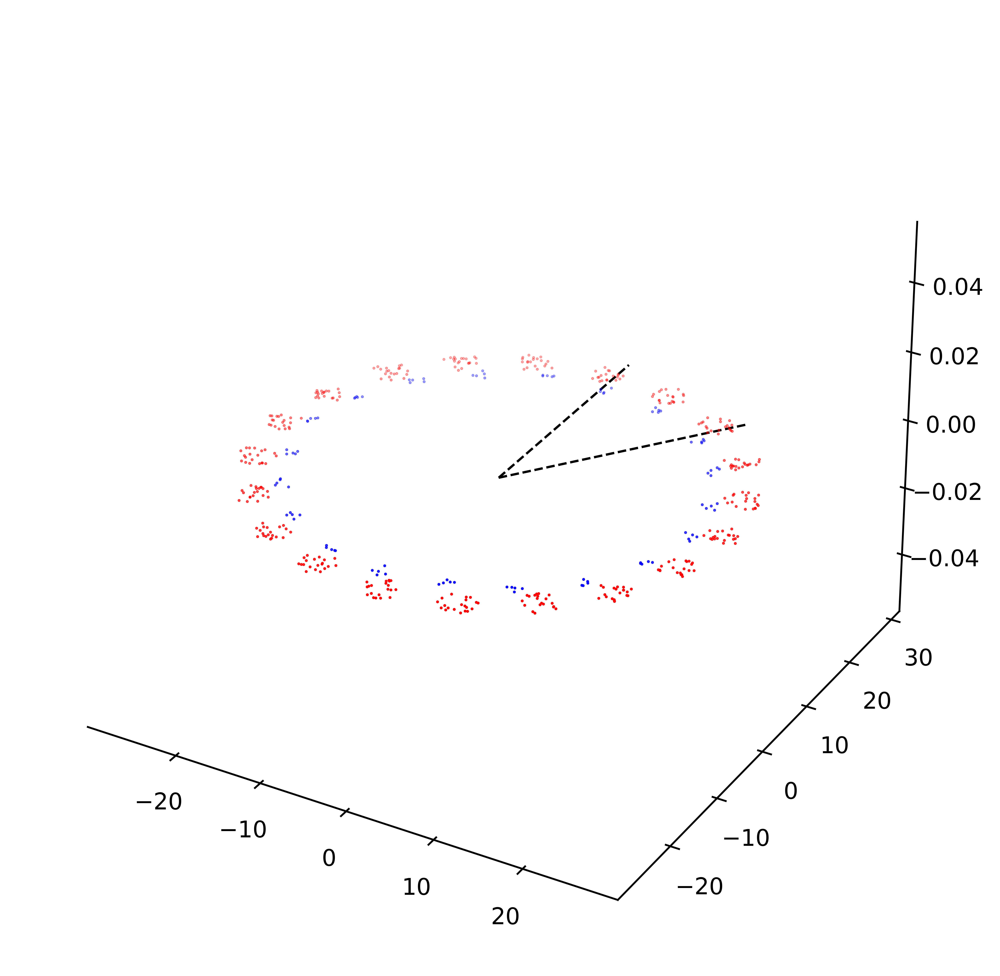

In [107]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

skip = 20
s = 1
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s)
ax.plot([0,(radEring+radEpop*1.5)*np.sin(2*2*np.pi/net.Nori)],
        [0,(radEring+radEpop*1.5)*np.cos(2*2*np.pi/net.Nori)],[0,0],'k--',lw=s)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/ring_model_sites.pdf')

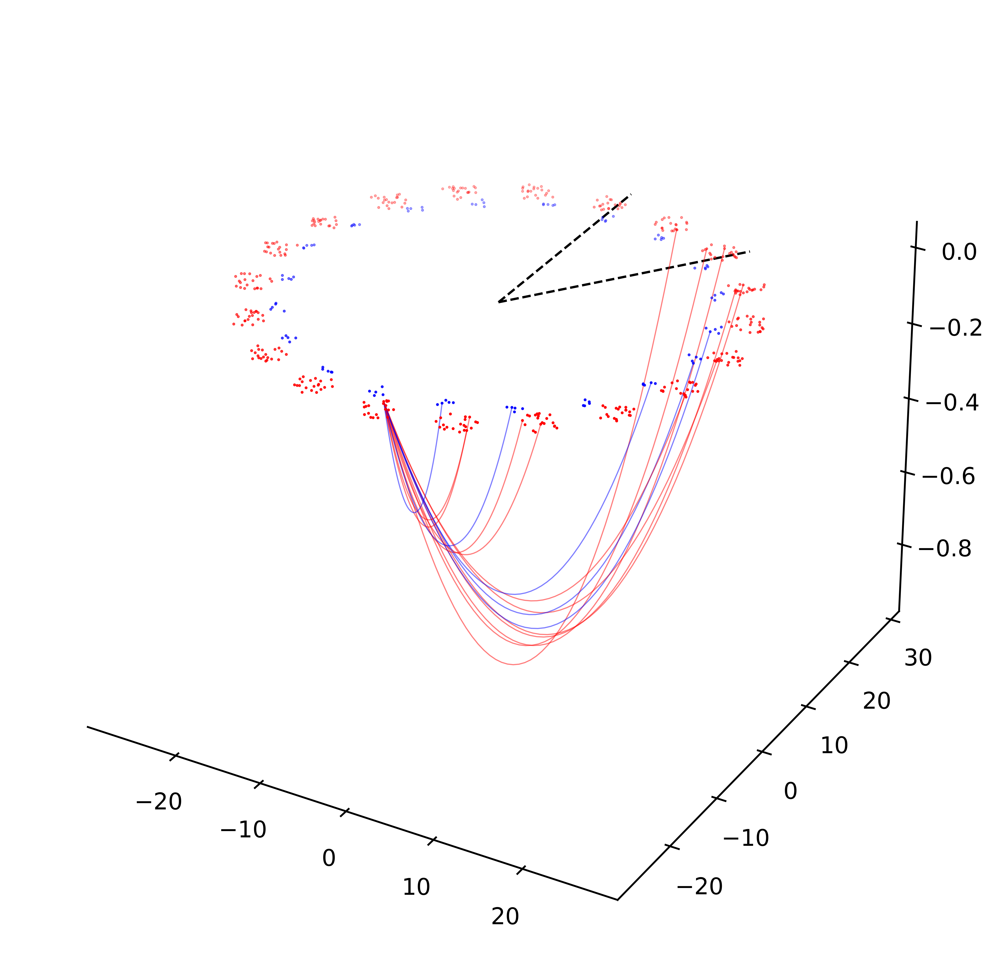

In [108]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

skip = 20
s = 1
npts = 50
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s)
ax.plot([0,(radEring+radEpop*1.5)*np.sin(2*2*np.pi/net.Nori)],
        [0,(radEring+radEpop*1.5)*np.cos(2*2*np.pi/net.Nori)],[0,0],'k--',lw=s)
for i in range(0,N//2,skip):
    h = abs(((i-N//2)//Nperori)/Nori)
    if h < 0.5: h = 1-h
    h = 2*(h-0.5)
    h = np.sqrt(1 - 0.8*h)
    reps = [1]
    for j in reps:
        if np.abs(net.M[i,N//2+j*skip]) > 1e-12:
                ax.plot(np.linspace(pts[N//2,1],pts[i,1],npts),
                        np.linspace(pts[N//2,0],pts[i,0],npts),
                        -(h**2-np.linspace(-h,h,npts)**2),colors[i],lw=s/2,alpha=0.5)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/ring_model_conn.pdf')

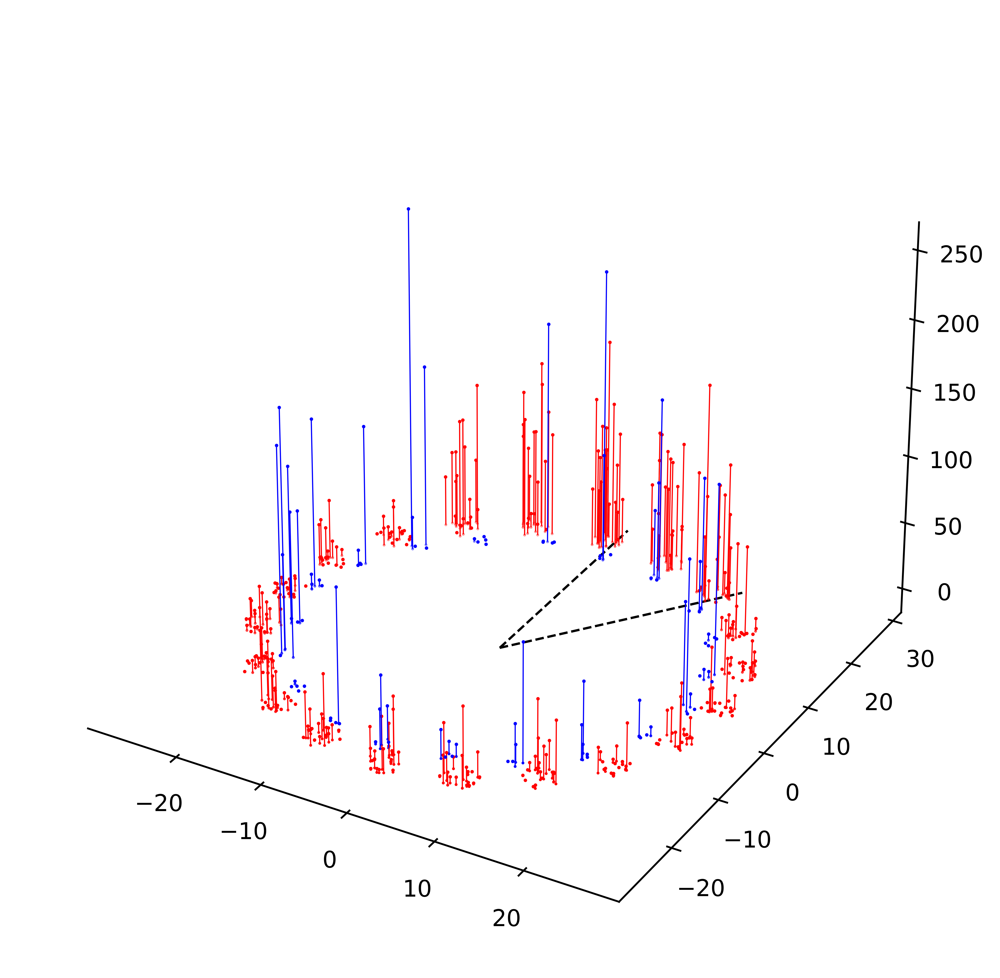

In [109]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d',computed_zorder=False))

skip = 20
s = 1
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s,zorder=0)
ax.plot([0,(radEring+radEpop*1.5)*np.sin(2*2*np.pi/net.Nori)],
        [0,(radEring+radEpop*1.5)*np.cos(2*2*np.pi/net.Nori)],[0,0],'k--',lw=s,zorder=0)
Emarkerline,Estemline,Ebaseline = ax.stem(pts[net.C_all[0],1][::skip],pts[net.C_all[0],0][::skip],
                                            rates[net.C_all[0]][::skip])
Imarkerline,Istemline,Ibaseline = ax.stem(pts[net.C_all[1],1][::skip],pts[net.C_all[1],0][::skip],
                                            rates[net.C_all[1]][::skip])
plt.setp(Ebaseline,linewidth = 0)
plt.setp(Ibaseline,linewidth = 0)
plt.setp(Estemline,linewidth = s/2,color='r',zorder=1)
plt.setp(Istemline,linewidth = s/2,color='b',zorder=2)
plt.setp(Emarkerline,markersize = s/2,color='r',zorder=1)
plt.setp(Imarkerline,markersize = s/2,color='b',zorder=2)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/ring_model_rates.pdf')

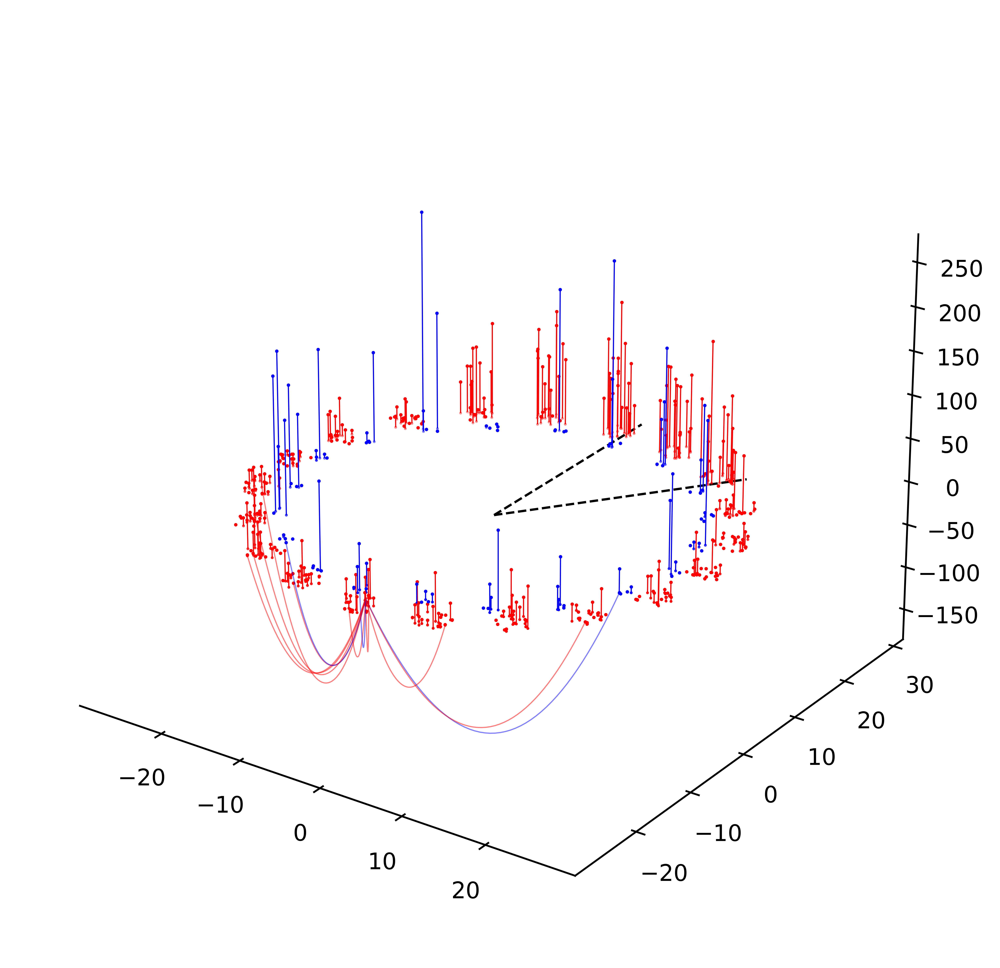

In [110]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d',computed_zorder=False))

def xy_path(pti,ptf,npts):
    ri = np.sqrt(np.sum(pti**2))
    rf = np.sqrt(np.sum(ptf**2))
    thti = np.arctan2(pti[0],pti[1])
    thtf = np.arctan2(ptf[0],ptf[1])
    return np.linspace(ri,rf,npts)*np.cos(np.linspace(thti,thtf,npts)),\
                np.linspace(ri,rf,npts)*np.sin(np.linspace(thti,thtf,npts))

skip = 20
s = 1
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s,zorder=0)
ax.plot([0,(radEring+radEpop*1.5)*np.sin(2*2*np.pi/net.Nori)],
        [0,(radEring+radEpop*1.5)*np.cos(2*2*np.pi/net.Nori)],[0,0],'k--',lw=s,zorder=0)
for i in range(0,N,2*skip):
    h = abs(((i-N//2)//Nperori)/Nori)
    if h < 0.5: h = 1-h
    h = 2*(h-0.5)
    h = np.sqrt(1 - 0.8*h)
    # h = (1 - 0.8*h)**(1/4)
    reps = [5]#1,2,4
    for j in reps:
        if np.abs(net.M[i,N//2+j*skip]) > 1e-12:
                ax.plot(np.linspace(pts[N//2,1],pts[i,1],npts),
                        np.linspace(pts[N//2,0],pts[i,0],npts),
                        -300*(h**2-np.linspace(-h,h,npts)**2),colors[i],lw=s/2,alpha=0.5)
                # ax.plot(*xy_path(pts[N//2],pts[i],npts),
                #         -300*(h**2-np.linspace(-h,h,npts)**2),colors[i],lw=s/2,alpha=0.5)
Emarkerline,Estemline,Ebaseline = ax.stem(pts[net.C_all[0],1][::skip],pts[net.C_all[0],0][::skip],
                                            rates[net.C_all[0]][::skip])
Imarkerline,Istemline,Ibaseline = ax.stem(pts[net.C_all[1],1][::skip],pts[net.C_all[1],0][::skip],
                                            rates[net.C_all[1]][::skip])
plt.setp(Ebaseline,linewidth = 0)
plt.setp(Ibaseline,linewidth = 0)
plt.setp(Estemline,linewidth = s/2,color='r',zorder=1)
plt.setp(Istemline,linewidth = s/2,color='b',zorder=2)
plt.setp(Emarkerline,markersize = s/2,color='r',zorder=1)
plt.setp(Imarkerline,markersize = s/2,color='b',zorder=2)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

ax.view_init(elev=25,azim=-55)

fig.tight_layout()
fig.savefig('./../plots/ring_model_conn+rates.pdf')

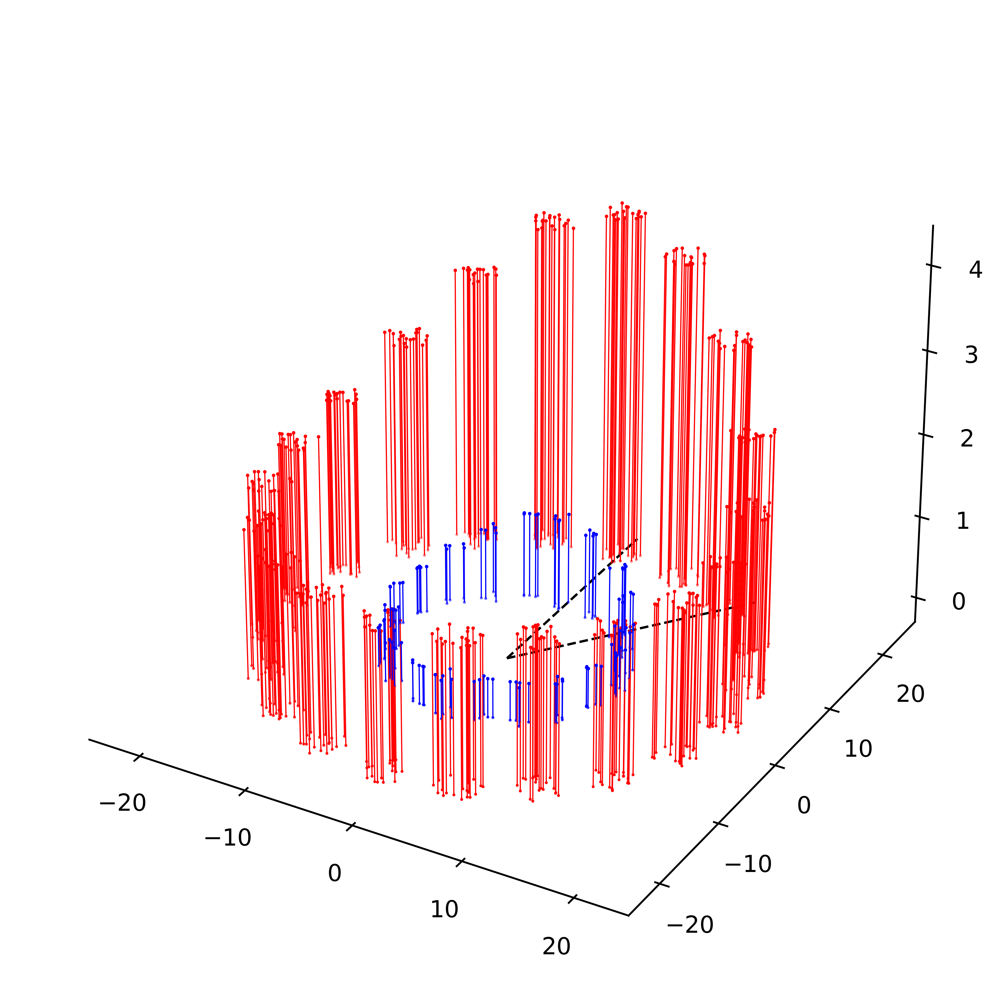

In [46]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d',computed_zorder=False))

skip = 20
s = 1
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s,zorder=0)
ax.plot([0,(radEring+radEpop*1.5)*np.sin(2*2*np.pi/net.Nori)],
        [0,(radEring+radEpop*1.5)*np.cos(2*2*np.pi/net.Nori)],[0,0],'k--',lw=s,zorder=0)
Emarkerline,Estemline,Ebaseline = ax.stem(pts[net.C_all[0],1][::skip],pts[net.C_all[0],0][::skip],
                                            (bX*B+aXs[-1]*H).numpy()[net.C_all[0]][::skip])
Imarkerline,Istemline,Ibaseline = ax.stem(pts[net.C_all[1],1][::skip],pts[net.C_all[1],0][::skip],
                                            (bX*B+aXs[-1]*H).numpy()[net.C_all[1]][::skip])
plt.setp(Ebaseline,linewidth = 0)
plt.setp(Ibaseline,linewidth = 0)
plt.setp(Estemline,linewidth = s/2,color='r',zorder=1)
plt.setp(Istemline,linewidth = s/2,color='b',zorder=2)
plt.setp(Emarkerline,markersize = s/2,color='r',zorder=1)
plt.setp(Imarkerline,markersize = s/2,color='b',zorder=2)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/ring_model_inputs.pdf')

In [33]:
import matplotlib.image as mpimg
Eimg = mpimg.imread('./../plots/Efig.png')
Iimg = mpimg.imread('./../plots/Ifig.png')

Exmesh,Eymesh = np.meshgrid(np.linspace(-1,1,Eimg.shape[0]),np.linspace(-1,1,Eimg.shape[1]))
Ixmesh,Iymesh = np.meshgrid(np.linspace(-1,1,Iimg.shape[0]),np.linspace(-1,1,Iimg.shape[1]))
Ezmesh = np.zeros_like(Exmesh)
Izmesh = np.zeros_like(Ixmesh)

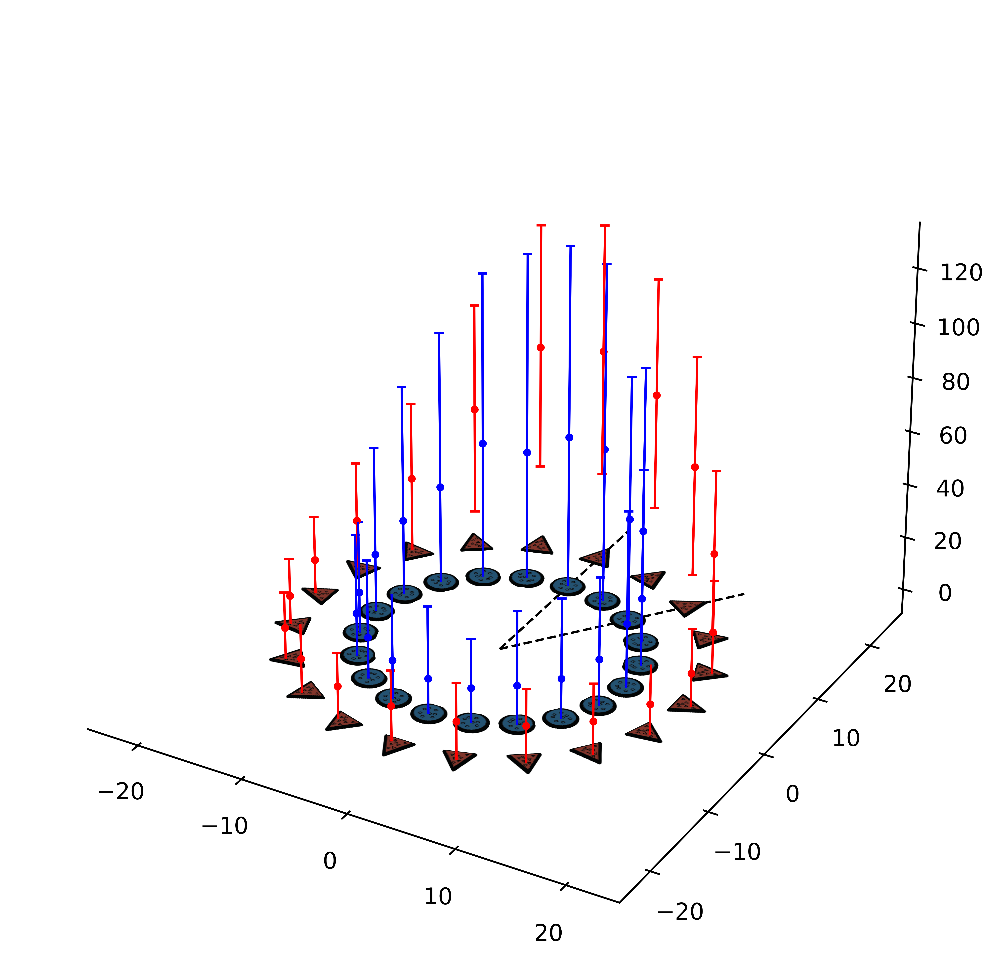

In [34]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

skip = 20
s = 1
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip],alpha=1e-12)
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s,zorder=0)
ax.plot([0,(radEring+radEpop*1.5)*np.sin(2*2*np.pi/net.Nori)],
        [0,(radEring+radEpop*1.5)*np.cos(2*2*np.pi/net.Nori)],[0,0],'k--',lw=s,zorder=0)
for locidx in range(Nori):
    rotang = -np.pi/2 - 2*np.pi*locidx/Nori
    ax.plot_surface(0.9*radEring*np.sin(2*np.pi*locidx/Nori)+1.4*radIpop*(np.cos(rotang)*Eymesh-np.sin(rotang)*Exmesh),
                    0.9*radEring*np.cos(2*np.pi*locidx/Nori)+1.4*radIpop*(np.sin(rotang)*Eymesh+np.cos(rotang)*Exmesh),
                    Ezmesh,rstride=1,cstride=1,facecolors=Eimg)
    ax.plot_surface(1.2*radIring*np.sin(2*np.pi*locidx/Nori)+1.4*radIpop*(np.cos(rotang)*Iymesh-np.sin(rotang)*Ixmesh),
                    1.2*radIring*np.cos(2*np.pi*locidx/Nori)+1.4*radIpop*(np.sin(rotang)*Iymesh+np.cos(rotang)*Ixmesh),
                    Izmesh,rstride=1,cstride=1,facecolors=Iimg)
    Emin = np.fmax(0,np.mean(rates[net.C_idxs[0][locidx]])-np.std(rates[net.C_idxs[0][locidx]]))
    Emax = np.fmax(0,np.mean(rates[net.C_idxs[0][locidx]])+np.std(rates[net.C_idxs[0][locidx]]))
    ax.errorbar(0.9*radEring*np.sin(2*np.pi*locidx/Nori),
                0.9*radEring*np.cos(2*np.pi*locidx/Nori),
                0.5*(Emin+Emax),0.5*(Emax-Emin),color='r',lw=s,capsize=2*s)
    ax.scatter(0.9*radEring*np.sin(2*np.pi*locidx/Nori),
               0.9*radEring*np.cos(2*np.pi*locidx/Nori),
               np.mean(rates[net.C_idxs[0][locidx]]),s=2*s,color='r',lw=2*s)
    Imin = np.fmax(0,np.mean(rates[net.C_idxs[1][locidx]])-np.std(rates[net.C_idxs[1][locidx]]))
    Imax = np.fmax(0,np.mean(rates[net.C_idxs[1][locidx]])+np.std(rates[net.C_idxs[1][locidx]]))
    ax.errorbar(1.2*radIring*np.sin(2*np.pi*locidx/Nori),
                1.2*radIring*np.cos(2*np.pi*locidx/Nori),
                0.5*(Imin+Imax),0.5*(Imax-Imin),color='b',lw=s,capsize=2*s)
    ax.scatter(1.2*radIring*np.sin(2*np.pi*locidx/Nori),
               1.2*radIring*np.cos(2*np.pi*locidx/Nori),
               np.mean(rates[net.C_idxs[1][locidx]]),s=2*s,color='b',lw=2*s)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/mft_model_sites.pdf')

In [231]:
size = 77
radI = size*12/2/1.4
radE = size*18/2/1.4
centx = 1920//2
centy = 1080//2
print(centx+radE*np.sin(np.arange(Nori)/Nori*2*np.pi)-size//2)
print(centy+radE*np.cos(np.arange(Nori)/Nori*2*np.pi)-size//2)
print()
print(centx+radI*np.sin(np.arange(Nori)/Nori*2*np.pi)-size//2)
print(centy+radI*np.cos(np.arange(Nori)/Nori*2*np.pi)-size//2)

[ 922.         1074.96341222 1212.95369988 1322.46341222 1392.77297557
 1417.         1392.77297557 1322.46341222 1212.95369988 1074.96341222
  922.          769.03658778  631.04630012  521.53658778  451.22702443
  427.          451.22702443  521.53658778  631.04630012  769.03658778]
[997.         972.77297557 902.46341222 792.95369988 654.96341222
 502.         349.03658778 211.04630012 101.53658778  31.22702443
   7.          31.22702443 101.53658778 211.04630012 349.03658778
 502.         654.96341222 792.95369988 902.46341222 972.77297557]

[ 922.         1023.97560814 1115.96913326 1188.97560814 1235.84865038
 1252.         1235.84865038 1188.97560814 1115.96913326 1023.97560814
  922.          820.02439186  728.03086674  655.02439186  608.15134962
  592.          608.15134962  655.02439186  728.03086674  820.02439186]
[832.         815.84865038 768.97560814 695.96913326 603.97560814
 502.         400.02439186 308.03086674 235.02439186 188.15134962
 172.         188.15134962 235.0

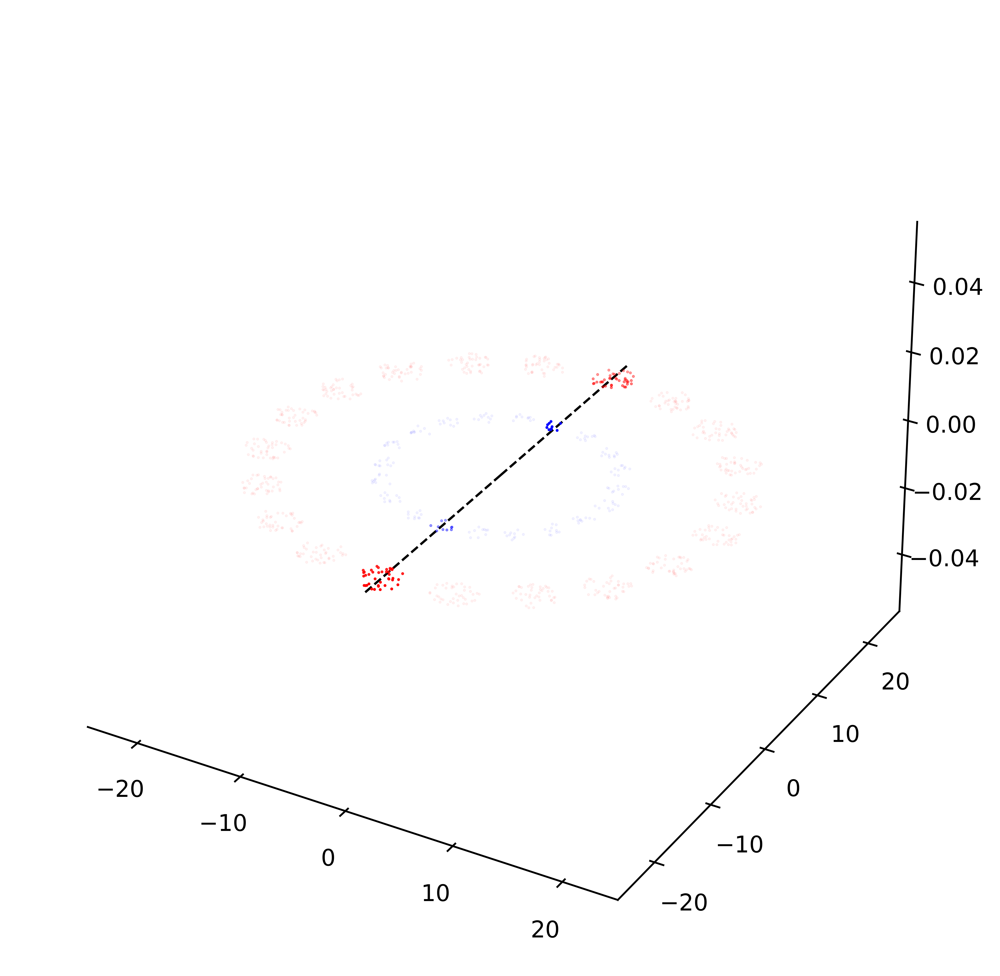

In [149]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

skip = 10
s = 1
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip],alpha=0.05)
ax.scatter(pts[:Nperori:skip,1],pts[:Nperori:skip,0],np.zeros(Nperori//skip),
           s=s,lw=s/4,c=colors[:Nperori:skip])
ax.scatter(pts[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip,1],
           pts[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip,0],np.zeros(Nperori//skip),
           s=s,lw=s/4,c=colors[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s)
ax.plot([0,0],[0,-(radEring+radEpop*1.5)],[0,0],'k--',lw=s)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/reduced_model_sites.pdf')

In [158]:
with open('./../results/best_fit_1s_c_5.pkl','rb') as\
        handle:
    res_dict = pickle.load(handle)
res_dict.keys()

dict_keys(['prms', 'μrEs', 'μrIs', 'ΣrEs', 'ΣrIs', 'μhEs', 'μhIs', 'ΣhEs', 'ΣhIs', 'balEs', 'balIs', 'Lexps', 'all_base_means', 'all_base_stds', 'all_opto_means', 'all_opto_stds', 'all_diff_means', 'all_diff_stds', 'all_norm_covs', 'all_bals', 'all_oves', 'all_ovxs', 'vsm_base_means', 'vsm_base_stds', 'vsm_opto_means', 'vsm_opto_stds', 'vsm_diff_means', 'vsm_diff_stds', 'vsm_norm_covs', 'vsm_bals', 'vsm_oves', 'vsm_ovxs', 'timeouts'])

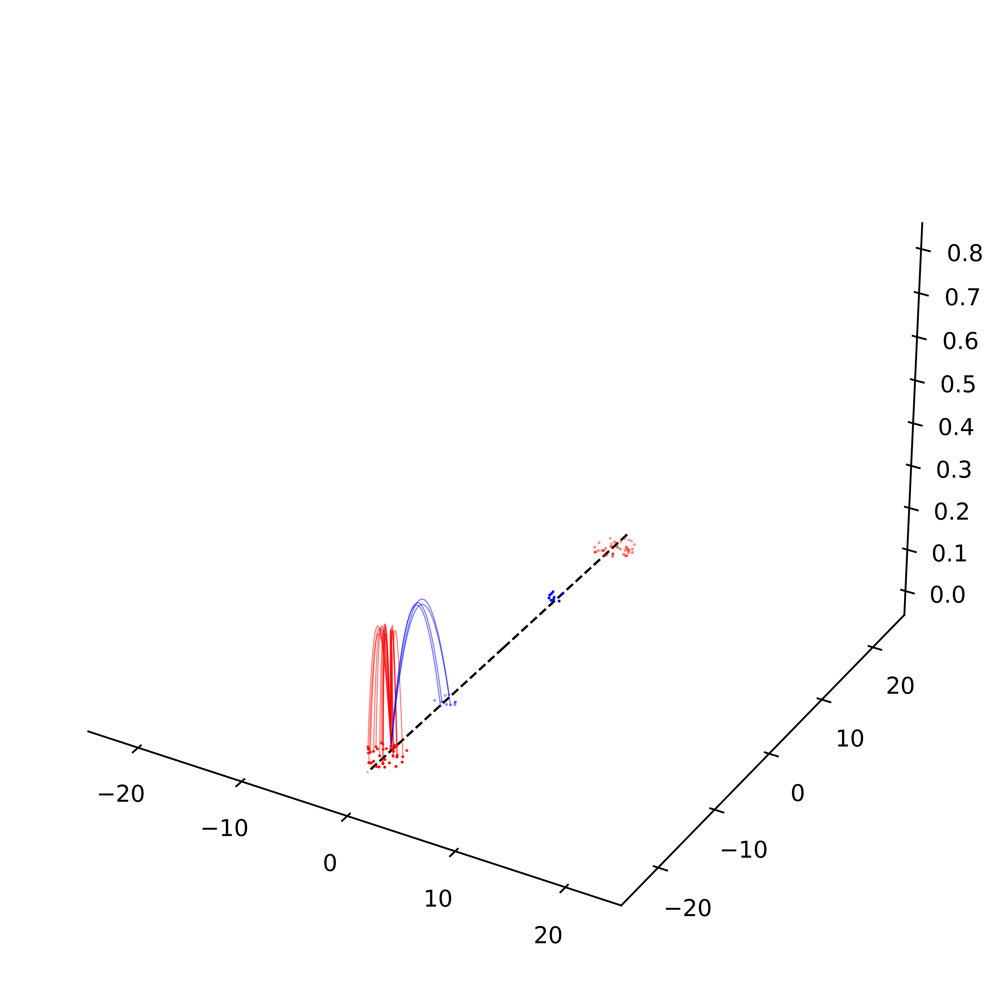

In [177]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

skip = 10
s = 1
npts = 50
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip],alpha=1e-12)
ax.scatter(pts[:Nperori:skip,1],pts[:Nperori:skip,0],np.zeros(Nperori//skip),
           s=s,lw=s/4,c=colors[:Nperori:skip])
ax.scatter(pts[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip,1],
           pts[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip,0],np.zeros(Nperori//skip),
           s=s,lw=s/4,c=colors[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s)
ax.plot([0,0],[0,-(radEring+radEpop*1.5)],[0,0],'k--',lw=s)
rng = np.random.default_rng(0)
peakidx = 0
baseidx = (Nori//2)*Nperori
for i in range(0,Nperori,skip):
    if rng.random() < 0.5:
        h = np.sqrt(1-.8*.9)
        ax.plot(np.linspace(pts[baseidx,1],pts[baseidx+i,1],npts),
                np.linspace(pts[baseidx,0],pts[baseidx+i,0],npts),
                h**2-np.linspace(-h,h,npts)**2,colors[i],lw=s/2,alpha=0.5)
    if rng.random() < 0.5*0.4:
        h = np.sqrt(0.8)
        ax.plot(np.linspace(pts[peakidx,1],pts[baseidx+i,1],npts),
                np.linspace(pts[peakidx,0],pts[baseidx+i,0],npts),
                h**2-np.linspace(-h,h,npts)**2,colors[i],lw=s/2,alpha=1e-12)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/reduced_model_base_conn.pdf')

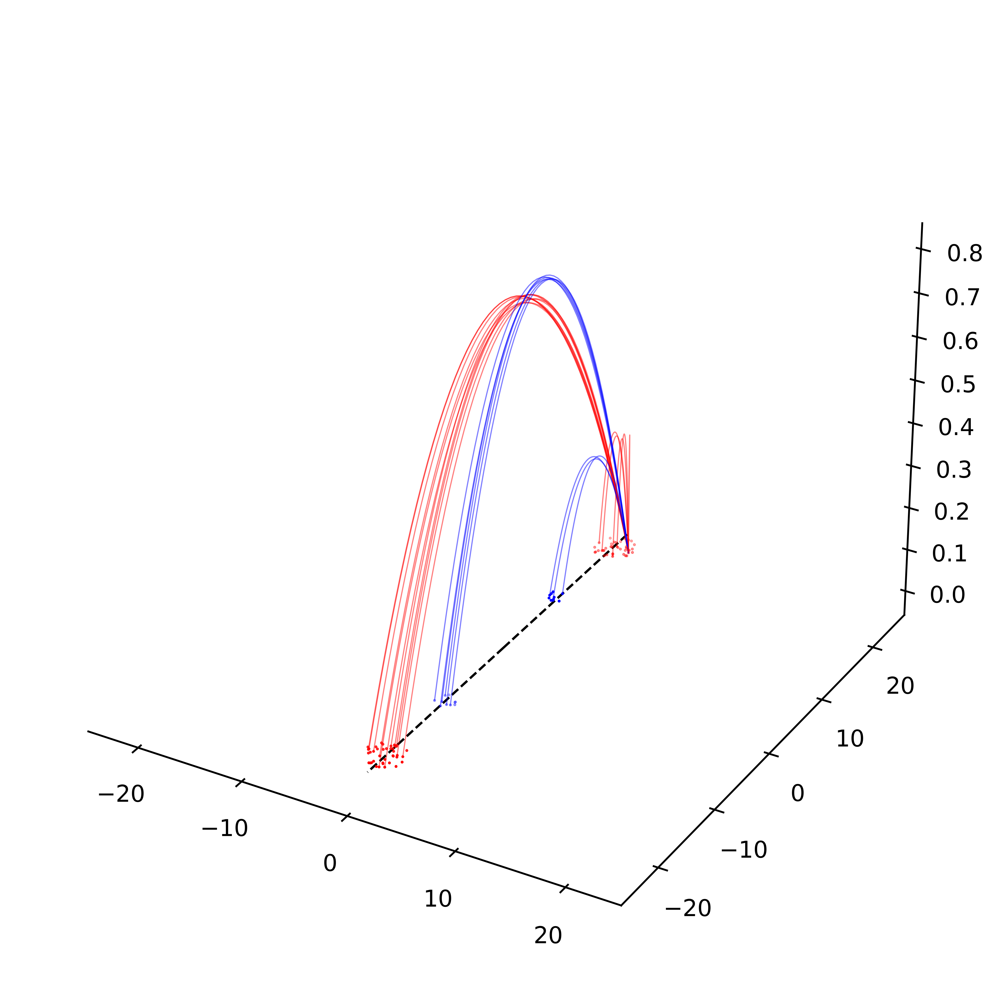

In [179]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

skip = 10
s = 1
npts = 50
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip],alpha=1e-12)
ax.scatter(pts[:Nperori:skip,1],pts[:Nperori:skip,0],np.zeros(Nperori//skip),
           s=s,lw=s/4,c=colors[:Nperori:skip])
ax.scatter(pts[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip,1],
           pts[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip,0],np.zeros(Nperori//skip),
           s=s,lw=s/4,c=colors[(Nori//2)*Nperori:(Nori//2+1)*Nperori:skip])
ax.plot([0,0],[0,radEring+radEpop*1.5],[0,0],'k--',lw=s)
ax.plot([0,0],[0,-(radEring+radEpop*1.5)],[0,0],'k--',lw=s)
rng = np.random.default_rng(2)
peakidx = 0
baseidx = (Nori//2)*Nperori
for i in range(0,Nperori,skip):
    if rng.random() < 0.5*0.7:
        h = np.sqrt(0.8)
        ax.plot(np.linspace(pts[peakidx,1],pts[baseidx+i,1],npts),
                np.linspace(pts[peakidx,0],pts[baseidx+i,0],npts),
                h**2-np.linspace(-h,h,npts)**2,colors[i],lw=s/2,alpha=0.5)
    if rng.random() < 0.5*0.3:
        h = np.sqrt(1-.8*.9)
        ax.plot(np.linspace(pts[peakidx,1],pts[peakidx+i,1],npts),
                np.linspace(pts[peakidx,0],pts[peakidx+i,0],npts),
                h**2-np.linspace(-h,h,npts)**2,colors[i],lw=s/2,alpha=0.5)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

fig.tight_layout()
fig.savefig('./../plots/reduced_model_peak_conn.pdf')

# Arrange Unstructured Network

In [19]:
radEring = 40
radIring = -60
radEpop = 2*Nori
radIpop = 1*Nori

Nperori = N//Nori
pts = np.zeros((N,2))
pops = np.zeros(N).astype(int)
colors = [None,]*N

rng = np.random.default_rng(0)
for i in range(net.N):
    locidx = i//Nori
    popidx = 0 if (i%Nperori) < net.NC[0] else 1
    pops[i] = popidx
    colors[i] = ['r','b'][popidx]
    locidx = 0
    
    r = np.sqrt(rng.random())
    tht = rng.random()*2*np.pi
    
    if popidx==0:
        pts[i,0] = radEring*np.cos(2*np.pi*locidx/Nori) + radEpop*r*np.cos(tht)
        pts[i,1] = radEring*np.sin(2*np.pi*locidx/Nori) + radEpop*r*np.sin(tht)
    else:
        pts[i,0] = radIring*np.cos(2*np.pi*locidx/Nori) + radIpop*r*np.cos(tht)
        pts[i,1] = radIring*np.sin(2*np.pi*locidx/Nori) + radIpop*r*np.sin(tht)

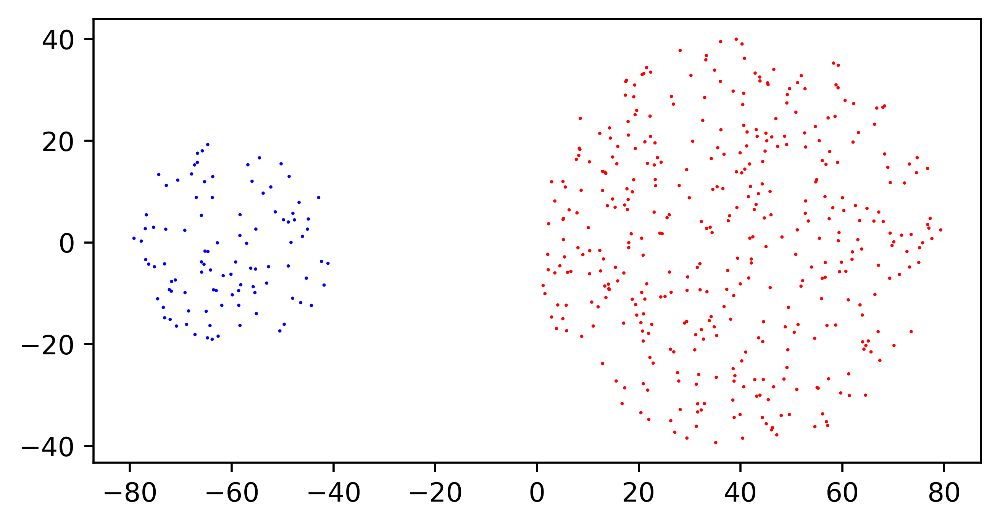

In [22]:
fig,axs = plt.subplots(1,1,figsize=(6,6),dpi=500)

skip = 20
s = 1
axs.scatter(pts[::skip,0],pts[::skip,1],s=s,lw=s/4,c=colors[::skip])
axs.set_aspect('equal')

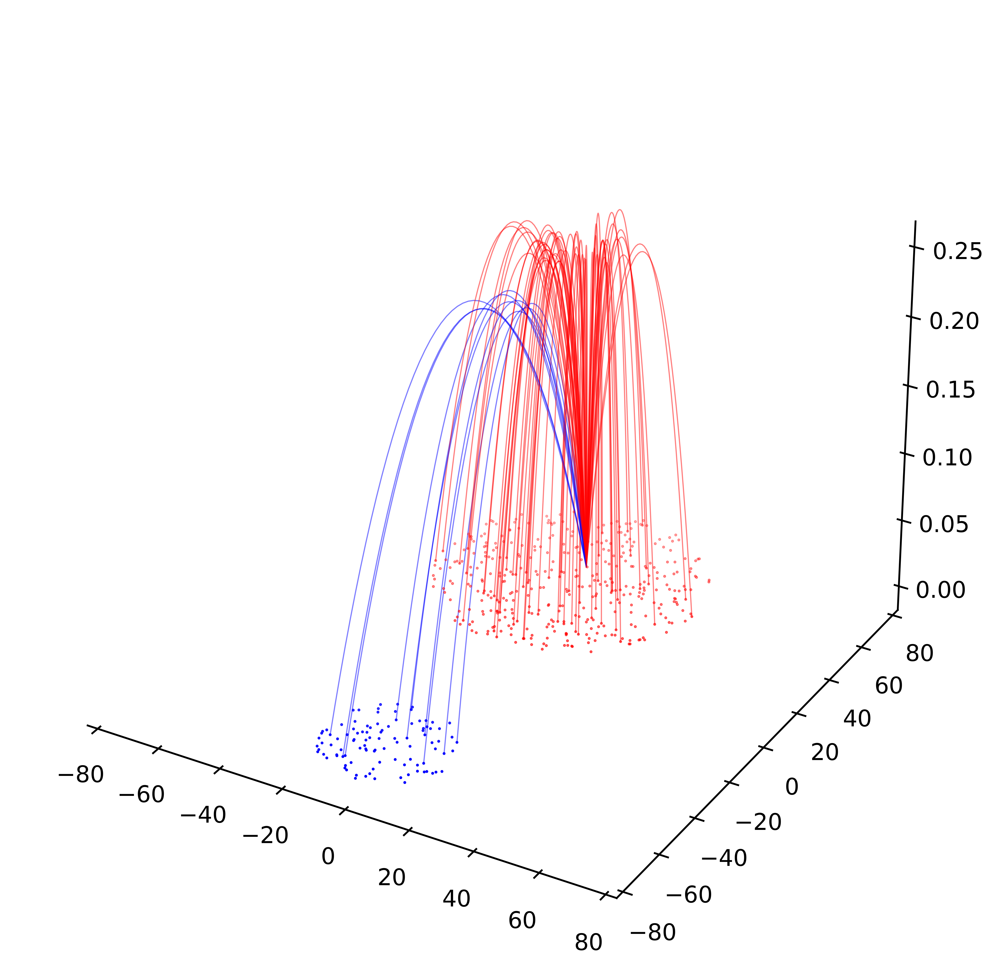

In [29]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d'))

skip = 20
s = 1
npts = 50
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip])
for i in range(0,net.N,skip):
    h = 0.5
    reps = [0,1]
    for j in reps:
        if np.abs(net.M[i,j*skip]) > 1e-12:
                ax.plot(np.linspace(pts[1,1],pts[i,1],npts),
                        np.linspace(pts[1,0],pts[i,0],npts),
                        h**2-np.linspace(-h,h,npts)**2,colors[i],lw=s/2,alpha=0.5)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

ax.set_xlim(-80,80)
ax.set_ylim(-80,80)

fig.tight_layout()
fig.savefig('./../plots/rand_model_conn.pdf')

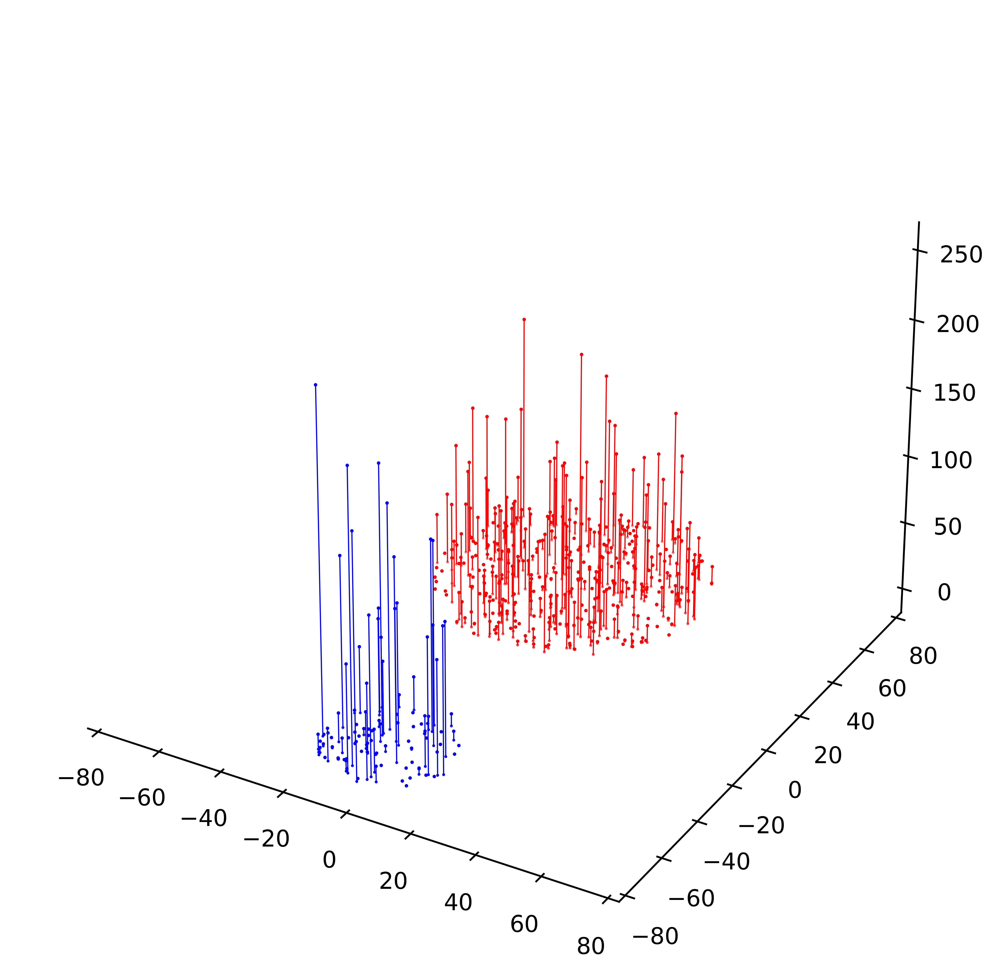

In [31]:
fig,ax = plt.subplots(1,1,figsize=(6,6),dpi=1000,subplot_kw=dict(projection='3d',computed_zorder=False))

skip = 20
s = 1
ax.scatter(pts[::skip,1],pts[::skip,0],np.zeros(net.N//skip),s=s,lw=s/4,c=colors[::skip])
Emarkerline,Estemline,Ebaseline = ax.stem(pts[net.C_all[0],1][::skip],pts[net.C_all[0],0][::skip],
                                            rates[net.C_all[0]][::skip])
Imarkerline,Istemline,Ibaseline = ax.stem(pts[net.C_all[1],1][::skip],pts[net.C_all[1],0][::skip],
                                            rates[net.C_all[1]][::skip])
plt.setp(Ebaseline,linewidth = 0)
plt.setp(Ibaseline,linewidth = 0)
plt.setp(Estemline,linewidth = s/2,color='r',zorder=1)
plt.setp(Istemline,linewidth = s/2,color='b',zorder=2)
plt.setp(Emarkerline,markersize = s/2,color='r',zorder=1)
plt.setp(Imarkerline,markersize = s/2,color='b',zorder=2)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

ax.set_xlim(-80,80)
ax.set_ylim(-80,80)

fig.tight_layout()
fig.savefig('./../plots/rand_model_rates.pdf')

# Create Plots for DMFT Self-Consistency Figure

In [99]:
with open('./../results/dmft_best_fit_id_None_c_5.pkl','rb') as\
        handle:
    res_dict = pickle.load(handle)
res_dict['dmft_res']

{'rb': array([ 9.466255, 21.997932, 12.785814, 27.452024], dtype=float32),
 'ra': array([36.055576, 42.119823, 38.103115, 46.164043], dtype=float32),
 'rp': array([63.067207, 44.415062, 63.082382, 48.360077], dtype=float32),
 'sr': array([12.68153003, 33.16998107, 12.81167332, 32.6262031 ]),
 'Crb': array([[ 315.60086,  315.55515,  315.41833,  315.19138,  314.87564,
          314.4732 ,  313.9867 ,  313.41907,  312.77383,  312.05515,
          311.26727,  310.41473,  309.50214,  308.53467,  307.51758,
          306.4558 ,  305.3544 ,  304.21866,  303.05353,  301.86407,
          300.65482,  299.43066,  298.1958 ,  296.95444,  295.71057,
          294.4678 ,  293.22946,  291.99896,  290.77914,  289.57248,
          288.38153,  287.2084 ,  286.055  ,  284.923  ,  283.81393,
          282.72903,  281.6692 ,  280.63556,  279.6287 ,  278.6492 ,
          277.6975 ,  276.77383,  275.87827,  275.01086,  274.17166,
          273.36053,  272.57715,  271.821  ,  271.09195,  270.38956,
          

In [122]:
rb = np.array([15.133126,15.398534])
rp = np.array([78.02721,55.94795])
sr = np.array([16.641127,25.300125])

Crb = np.array([387.83896,801.8631])
Crp = np.array([8555.255,8954.791])
sCr = np.array([14.703152,23.641306])

tau = np.array([ri.tE,ri.tI],dtype=np.float32)
W = J*np.array([[1,-gE],[1./beta,-gI/beta]],dtype=np.float32)
Ks = np.array([K,K/4],dtype=np.float32)
Hb = (bX)*K*J*np.array([hE,hI/beta],dtype=np.float32)
Hp = (bX+aXs[-1])*K*J*np.array([hE,hI/beta],dtype=np.float32)
eH = eX

sH = np.array([SoriF,SoriF])
sH2 = sH**2
muHb = tau*Hb
muHp = tau*Hp
smuH2 = sH2
SigHb = (muHb*eH)**2
SigHp = (muHp*eH)**2
sSigH2 = sH2

muW = tau[:,None]*W*Ks
SigW = tau[:,None]**2*W**2*Ks

sW = np.array([[SoriE,SoriI],[SoriE,SoriI]],dtype=np.float32)
sW2 = sW**2
sr2 = sr**2
sCr2 = sCr**2
sWr2 = sW2+sr2
sWCr2 = sW2+sCr2

mub = muW*rb
mup = mub + np.sqrt(sr2/sWr2)*muW*(rp-rb)
smu2 = sWr2
Sigb = SigW*Crb
Sigp = Sigb + np.sqrt(sCr2/sWCr2)*SigW*(Crp-Crb)
sSig2 = sWCr2

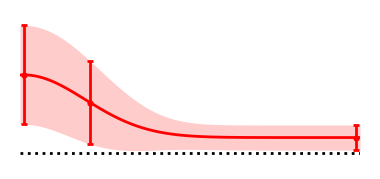

In [123]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,90])

def gauss(x,b,p,s2):
    return b + (p-b)*np.exp(-0.5*x**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris,rE,'r',lw=size)
ax.fill_between(oris,rE+sigrE,rE-sigrE,color='r',lw=0,alpha=0.2)
ax.set_xlim(-1,91)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats.pdf')

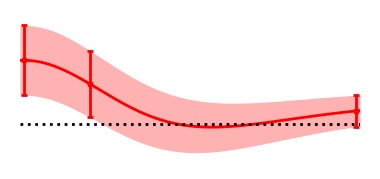

In [124]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,90])

def gauss(x,b,p,s2):
    return b + (p-b)*np.exp(-0.5*x**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

muE = gauss(oris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(oris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(oris,muHb[0],muHp[0],smuH2[0])
sigE = np.sqrt(gauss(oris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(oris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(oris,SigHb[0],SigHp[0],sH2[0]))
submuE = gauss(suboris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(suboris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(suboris,muHb[0],muHp[0],smuH2[0])
subsigE = np.sqrt(gauss(suboris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(suboris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(suboris,SigHb[0],SigHp[0],sH2[0]))
ax.plot(oris,muE,'r',lw=size)
ax.fill_between(oris,muE+sigE,muE-sigE,color='r',lw=0,alpha=0.3)
ax.set_xlim(-1,91)
# ax.set_ylim(-0.001,1.01*(mup[0,0]+mup[0,1]+muHp[0]+np.sqrt(Sigp[0,0]+Sigp[0,1]+SigHp[0])))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
ax.scatter(suboris,submuE,s=5*size,c='r',lw=0,zorder=4)
ax.errorbar(suboris,submuE,subsigE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_input_stats.pdf')

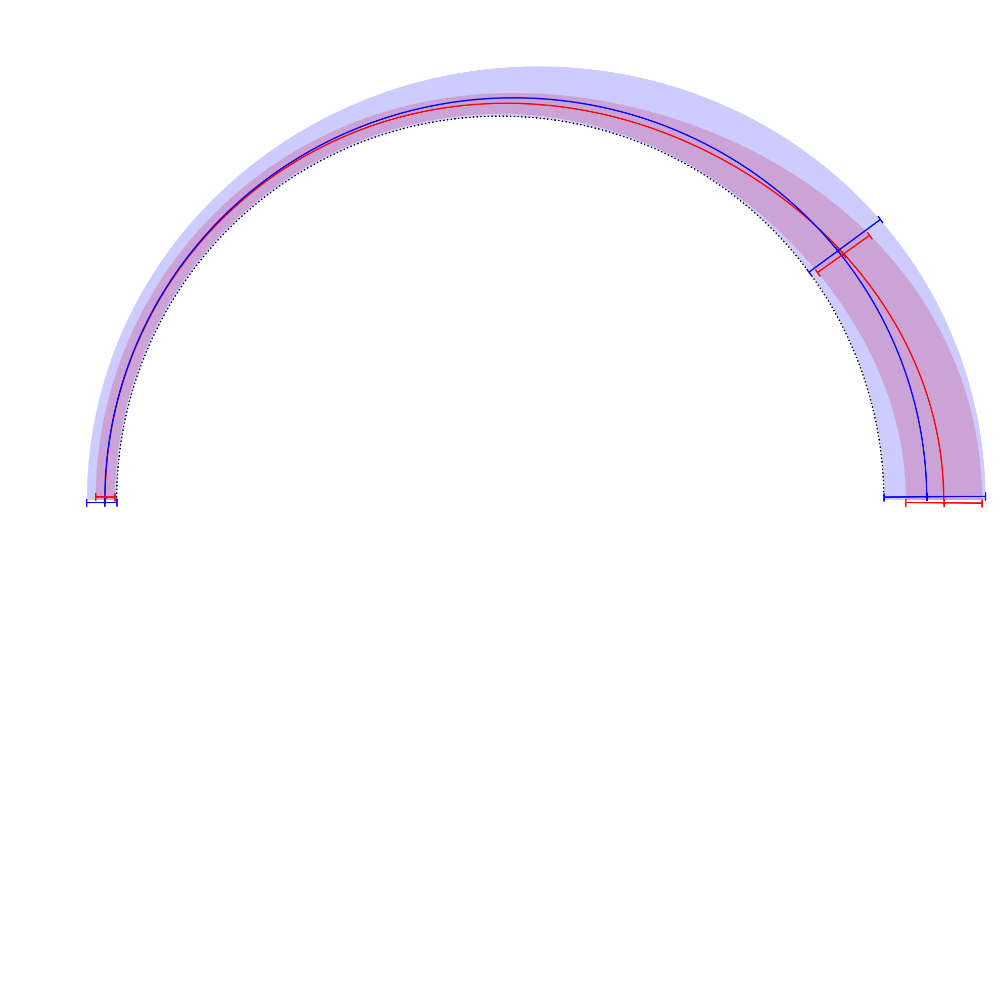

In [125]:
oris = np.linspace(0,90,361)
suboris = np.array([0,18,90])
base_r = 500

def gauss(x,b,p,s2):
    return b + (p-b)*dmft.basesubwrapnorm(x,np.sqrt(s2))

size = 10
fig,ax = plt.subplots(1,1,figsize=(1*size,1*size),dpi=200,subplot_kw={'projection': 'polar'})

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
rI = gauss(oris,rb[1],rp[1],sr[1]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
sigrI = np.sqrt(gauss(oris,Crb[1],Crp[1],sCr[1]**2)-\
    gauss(oris,rb[1],rp[1],sr[1]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subrI = gauss(suboris,rb[1],rp[1],sr[1]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
subsigrI = np.sqrt(gauss(suboris,Crb[1],Crp[1],sCr[1]**2)-\
    gauss(suboris,rb[1],rp[1],sr[1]**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=1)
ax.plot(oris*2*np.pi/180,base_r+rI,'b',lw=1)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
ax.fill_between(oris*2*np.pi/180,base_r+rI+sigrI,base_r+np.fmax(0,rI-sigrI),color='b',lw=0,alpha=0.2)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=1)
ax.scatter((suboris-0.2)*2*np.pi/180,base_r+subrE,s=5,c='r',lw=0,zorder=4)
ax.scatter((suboris+0.2)*2*np.pi/180,base_r+subrI,s=5,c='b',lw=0,zorder=4)
ax.errorbar((suboris-0.2)*2*np.pi/180,base_r+subrE,np.fmin(subrE,subsigrE),lolims=False,uplims=True,
    c='r',ls='none',capsize=3,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris-0.2)*2*np.pi/180,base_r+subrE,subsigrE,lolims=True,uplims=False,
    c='r',ls='none',capsize=3,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.2)*2*np.pi/180,base_r+subrI,np.fmin(subrI,subsigrI),lolims=False,uplims=True,
    c='b',ls='none',capsize=3,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.2)*2*np.pi/180,base_r+subrI,subsigrI,lolims=True,uplims=False,
    c='b',ls='none',capsize=3,lw=1,capthick=1,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_rate_polar_stats.pdf')

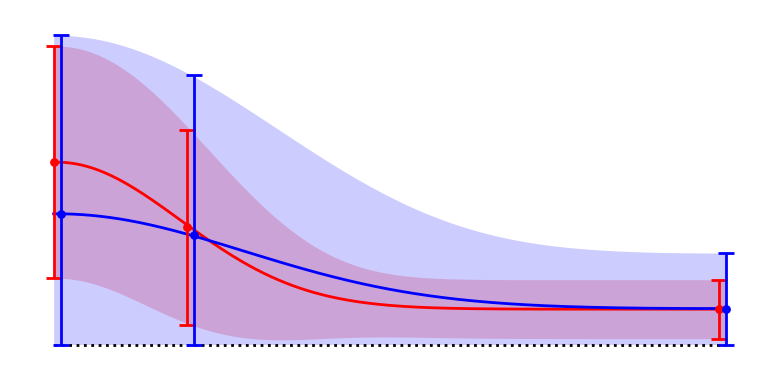

In [231]:
oris = np.linspace(-0.5,90.5,361)
suboris = np.array([0,18,90])
base_r = 0

def gauss(x,b,p,s2):
    return b + (p-b)*dmft.basesubwrapnorm(x,np.sqrt(s2))

size = 2
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
rI = gauss(oris,rb[1],rp[1],sr[1]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
sigrI = np.sqrt(gauss(oris,Crb[1],Crp[1],sCr[1]**2)-\
    gauss(oris,rb[1],rp[1],sr[1]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subrI = gauss(suboris,rb[1],rp[1],sr[1]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
subsigrI = np.sqrt(gauss(suboris,Crb[1],Crp[1],sCr[1]**2)-\
    gauss(suboris,rb[1],rp[1],sr[1]**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=1)
ax.plot(oris*2*np.pi/180,base_r+rI,'b',lw=1)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
ax.fill_between(oris*2*np.pi/180,base_r+rI+sigrI,base_r+np.fmax(0,rI-sigrI),color='b',lw=0,alpha=0.2)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=1)
ax.scatter((suboris-0.5)*2*np.pi/180,base_r+subrE,s=10,c='r',lw=0,zorder=4)
ax.scatter((suboris+0.5)*2*np.pi/180,base_r+subrI,s=10,c='b',lw=0,zorder=4)
ax.errorbar((suboris-0.5)*2*np.pi/180,base_r+subrE,[np.fmin(subrE,subsigrE),subsigrE],
    c='r',ls='none',capsize=3,lw=1,capthick=1,zorder=4,dash_capstyle='projecting')
ax.errorbar((suboris+0.5)*2*np.pi/180,base_r+subrI,[np.fmin(subrI,subsigrI),subsigrI],
    c='b',ls='none',capsize=3,lw=1,capthick=1,zorder=4,dash_capstyle='projecting')

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats.pdf')

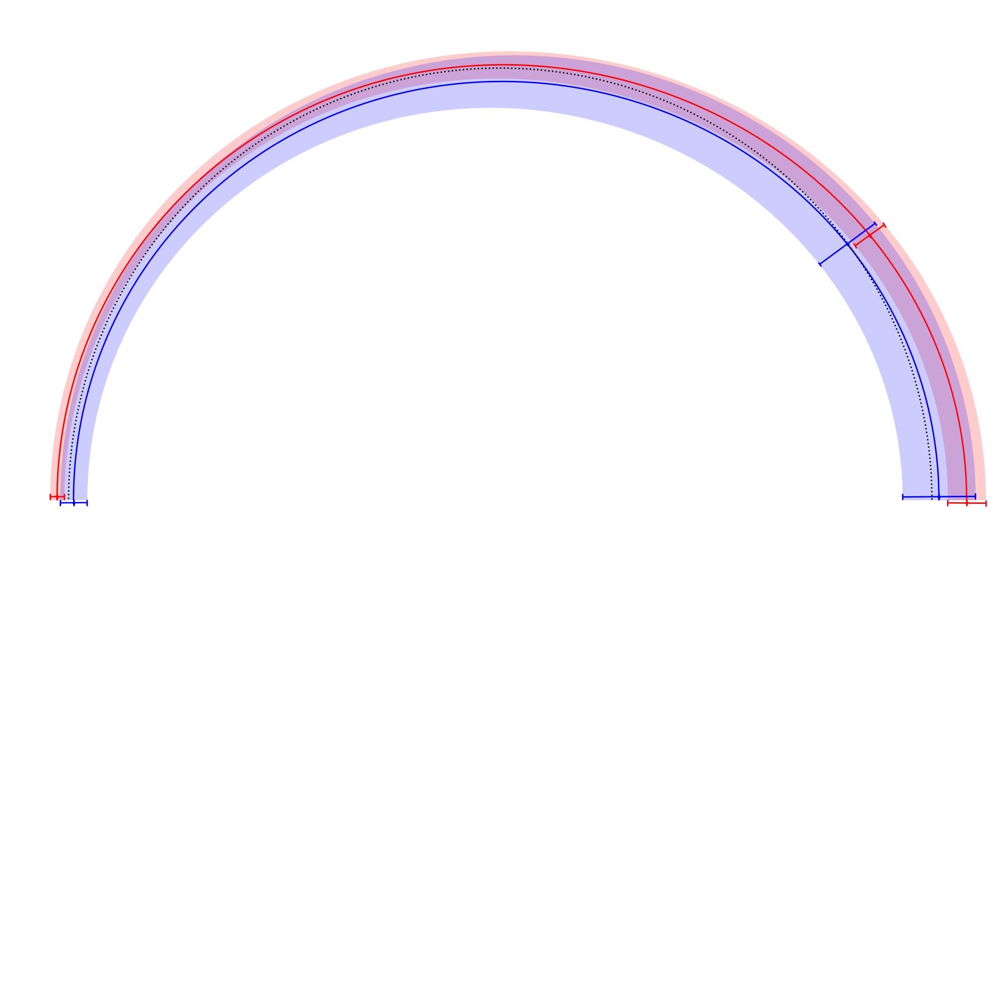

In [229]:
oris = np.linspace(-0,90,361)
suboris = np.array([0,18,90])
base_mu = 0.4

def gauss(x,b,p,s2):
    return b + (p-b)*dmft.basesubwrapnorm(x,np.sqrt(s2))

size = 10
fig,ax = plt.subplots(1,1,figsize=(1*size,1*size),dpi=200,subplot_kw={'projection': 'polar'})

muE = gauss(oris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(oris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(oris,muHb[0],muHp[0],smuH2[0])
muI = gauss(oris,mub[1,0],mup[1,0],sWr2[1,0])+\
    gauss(oris,mub[1,1],mup[1,1],sWr2[1,1])+\
    gauss(oris,muHb[1],muHp[1],smuH2[1])
sigE = np.sqrt(gauss(oris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(oris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(oris,SigHb[0],SigHp[0],sH2[0]))
sigI = np.sqrt(gauss(oris,Sigb[1,0],Sigp[1,0],sSig2[1,0])+\
    gauss(oris,Sigb[1,1],Sigp[1,1],sSig2[1,1])+\
    gauss(oris,SigHb[1],SigHp[1],sH2[1]))
submuE = gauss(suboris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(suboris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(suboris,muHb[0],muHp[0],smuH2[0])
submuI = gauss(suboris,mub[1,0],mup[1,0],sWr2[1,0])+\
    gauss(suboris,mub[1,1],mup[1,1],sWr2[1,1])+\
    gauss(suboris,muHb[1],muHp[1],smuH2[1])
subsigE = np.sqrt(gauss(suboris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(suboris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(suboris,SigHb[0],SigHp[0],sH2[0]))
subsigI = np.sqrt(gauss(suboris,Sigb[1,0],Sigp[1,0],sSig2[1,0])+\
    gauss(suboris,Sigb[1,1],Sigp[1,1],sSig2[1,1])+\
    gauss(suboris,SigHb[1],SigHp[1],sH2[1]))
ax.plot(oris*2*np.pi/180,base_mu+muE,'r',lw=1)
ax.plot(oris*2*np.pi/180,base_mu+muI,'b',lw=1)
ax.fill_between(oris*2*np.pi/180,base_mu+muE+sigE,base_mu+muE-sigE,color='r',lw=0,alpha=0.2)
ax.fill_between(oris*2*np.pi/180,base_mu+muI+sigI,base_mu+muI-sigI,color='b',lw=0,alpha=0.2)
# ax.set_ylim(-0.001,1.01*(mup[0,0]+mup[0,1]+muHp[0]+np.sqrt(Sigp[0,0]+Sigp[0,1]+SigHp[0])))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_mu*np.ones_like(oris),c='k',ls=':',lw=1)
ax.scatter((suboris-0.2)*2*np.pi/180,base_mu+submuE,s=5,c='r',lw=0,zorder=4)
ax.scatter((suboris+0.2)*2*np.pi/180,base_mu+submuI,s=5,c='b',lw=0,zorder=4)
ax.errorbar((suboris-0.2)*2*np.pi/180,base_mu+submuE,subsigE,lolims=False,uplims=True,
    c='r',ls='none',capsize=2,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris-0.2)*2*np.pi/180,base_mu+submuE,subsigE,lolims=True,uplims=False,
    c='r',ls='none',capsize=2,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.2)*2*np.pi/180,base_mu+submuI,subsigI,lolims=False,uplims=True,
    c='b',ls='none',capsize=2,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.2)*2*np.pi/180,base_mu+submuI,subsigI,lolims=True,uplims=False,
    c='b',ls='none',capsize=2,lw=1,capthick=1,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_input_polar_stats.pdf')

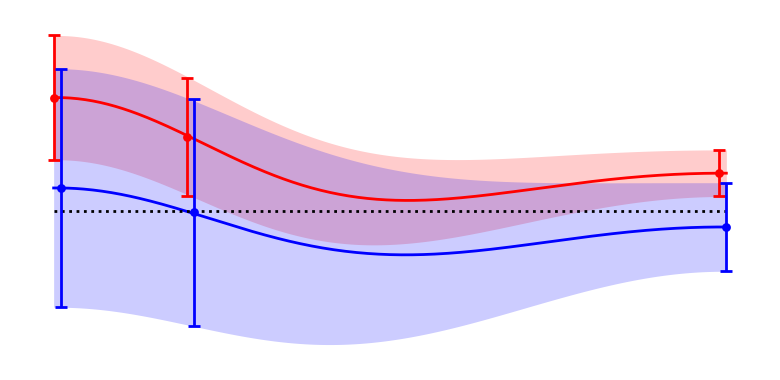

In [232]:
oris = np.linspace(-0.5,90.5,361)
suboris = np.array([0,18,90])
base_mu = 0

def gauss(x,b,p,s2):
    return b + (p-b)*dmft.basesubwrapnorm(x,np.sqrt(s2))

size = 2
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

muE = gauss(oris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(oris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(oris,muHb[0],muHp[0],smuH2[0])
muI = gauss(oris,mub[1,0],mup[1,0],sWr2[1,0])+\
    gauss(oris,mub[1,1],mup[1,1],sWr2[1,1])+\
    gauss(oris,muHb[1],muHp[1],smuH2[1])
sigE = np.sqrt(gauss(oris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(oris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(oris,SigHb[0],SigHp[0],sH2[0]))
sigI = np.sqrt(gauss(oris,Sigb[1,0],Sigp[1,0],sSig2[1,0])+\
    gauss(oris,Sigb[1,1],Sigp[1,1],sSig2[1,1])+\
    gauss(oris,SigHb[1],SigHp[1],sH2[1]))
submuE = gauss(suboris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(suboris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(suboris,muHb[0],muHp[0],smuH2[0])
submuI = gauss(suboris,mub[1,0],mup[1,0],sWr2[1,0])+\
    gauss(suboris,mub[1,1],mup[1,1],sWr2[1,1])+\
    gauss(suboris,muHb[1],muHp[1],smuH2[1])
subsigE = np.sqrt(gauss(suboris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(suboris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(suboris,SigHb[0],SigHp[0],sH2[0]))
subsigI = np.sqrt(gauss(suboris,Sigb[1,0],Sigp[1,0],sSig2[1,0])+\
    gauss(suboris,Sigb[1,1],Sigp[1,1],sSig2[1,1])+\
    gauss(suboris,SigHb[1],SigHp[1],sH2[1]))
ax.plot(oris*2*np.pi/180,base_mu+muE,'r',lw=1)
ax.plot(oris*2*np.pi/180,base_mu+muI,'b',lw=1)
ax.fill_between(oris*2*np.pi/180,base_mu+muE+sigE,base_mu+muE-sigE,color='r',lw=0,alpha=0.2)
ax.fill_between(oris*2*np.pi/180,base_mu+muI+sigI,base_mu+muI-sigI,color='b',lw=0,alpha=0.2)
# ax.set_ylim(-0.001,1.01*(mup[0,0]+mup[0,1]+muHp[0]+np.sqrt(Sigp[0,0]+Sigp[0,1]+SigHp[0])))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_mu*np.ones_like(oris),c='k',ls=':',lw=1)
ax.scatter((suboris-0.5)*2*np.pi/180,base_mu+submuE,s=10,c='r',lw=0,zorder=4)
ax.scatter((suboris+0.5)*2*np.pi/180,base_mu+submuI,s=10,c='b',lw=0,zorder=4)
ax.errorbar((suboris-0.5)*2*np.pi/180,base_mu+submuE,subsigE,
    c='r',ls='none',capsize=2,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.5)*2*np.pi/180,base_mu+submuI,subsigI,
    c='b',ls='none',capsize=2,lw=1,capthick=1,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_input_stats.pdf')

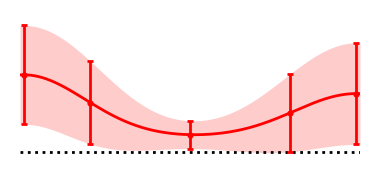

In [24]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,45,72,90])

def gauss(x,b,p,s2):
    return b + (p-b)*np.exp(-0.5*x**2/s2) + 0.7*(p-b)*np.exp(-0.5*(x-90)**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris,rE,'r',lw=size)
ax.fill_between(oris,rE+sigrE,rE-sigrE,color='r',lw=0,alpha=0.2)
ax.set_xlim(-1,91)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats_two_peaks.pdf')

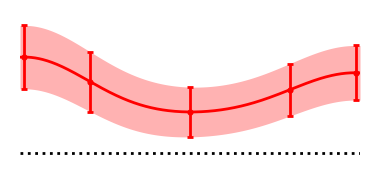

In [23]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,45,72,90])

def gauss(x,b,p,s2):
    return b + (p-b)*np.exp(-0.5*x**2/s2) + 0.7*(p-b)*np.exp(-0.5*(x-90)**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

muE = gauss(oris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(oris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(oris,muHb[0],muHp[0],smuH2[0])
sigE = np.sqrt(gauss(oris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(oris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(oris,SigHb[0],SigHp[0],sH2[0]))
submuE = gauss(suboris,mub[0,0],mup[0,0],sWr2[0,0])+\
    gauss(suboris,mub[0,1],mup[0,1],sWr2[0,1])+\
    gauss(suboris,muHb[0],muHp[0],smuH2[0])
subsigE = np.sqrt(gauss(suboris,Sigb[0,0],Sigp[0,0],sSig2[0,0])+\
    gauss(suboris,Sigb[0,1],Sigp[0,1],sSig2[0,1])+\
    gauss(suboris,SigHb[0],SigHp[0],sH2[0]))
ax.plot(oris,muE,'r',lw=size)
ax.fill_between(oris,muE+sigE,muE-sigE,color='r',lw=0,alpha=0.3)
ax.set_xlim(-1,91)
# ax.set_ylim(-0.001,1.01*(mup[0,0]+mup[0,1]+muHp[0]+np.sqrt(Sigp[0,0]+Sigp[0,1]+SigHp[0])))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
ax.scatter(suboris,submuE,s=5*size,c='r',lw=0,zorder=4)
ax.errorbar(suboris,submuE,subsigE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_input_stats_two_peaks.pdf')

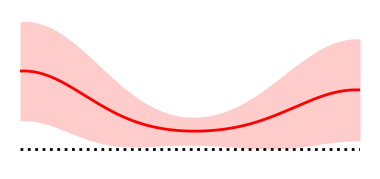

In [29]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,45,72,90])

def gauss(x,b,p,s2):
    return b + (p-b)*np.exp(-0.5*x**2/s2) + 0.7*(p-b)*np.exp(-0.5*(x-90)**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris,rE,'r',lw=size)
ax.fill_between(oris,rE+sigrE,rE-sigrE,color='r',lw=0,alpha=0.2)
ax.set_xlim(-1,91)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_ylim(-10,130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats_full.pdf')

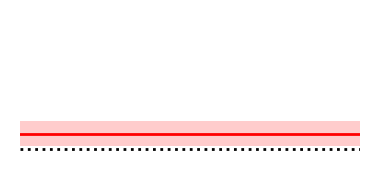

In [35]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,45,72,90])

def gauss(x,b,p,s2):
    return b*np.ones_like(x)# + (p-b)*np.exp(-0.5*x**2/s2) + 0.7*(p-b)*np.exp(-0.5*(x-90)**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris,rE,'r',lw=size)
ax.fill_between(oris,rE+sigrE,rE-sigrE,color='r',lw=0,alpha=0.2)
ax.set_xlim(-1,91)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_ylim(-10,130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats_baseline.pdf')

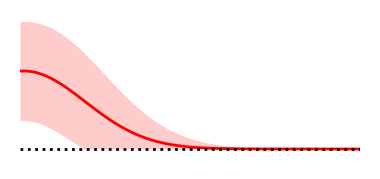

In [36]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,45,72,90])

def gauss(x,b,p,s2):
    return (p)*np.exp(-0.5*x**2/s2)# + 0.7*(p-b)*np.exp(-0.5*(x-90)**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris,rE,'r',lw=size)
ax.fill_between(oris,rE+sigrE,np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
ax.set_xlim(-1,91)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_ylim(-10,130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats_peak_one.pdf')

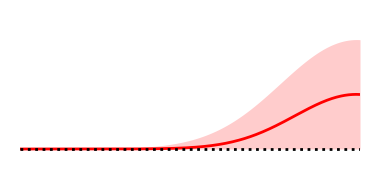

In [37]:
oris = np.linspace(-1,91,361)
suboris = np.array([0,18,45,72,90])

def gauss(x,b,p,s2):
    return 0.7*(p)*np.exp(-0.5*(x-90)**2/s2)

size = 1
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris,rE,'r',lw=size)
ax.fill_between(oris,rE+sigrE,np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
ax.set_xlim(-1,91)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.axhline(0,c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_ylim(-10,130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats_peak_two.pdf')

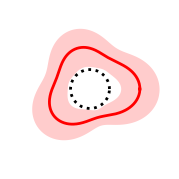

In [47]:
oris = np.linspace(0,180,361)
suboris = np.array([0,18,45,72,90])
base_r = 50

def gauss(x,b,p,s2):
    s = np.sqrt(s2)
    return b + (p-b)*dmft.basesubwrapnorm(x,s) + 0.7*(p-b)*dmft.basesubwrapnorm(x-54,s) +\
        0.8*(p-b)*dmft.basesubwrapnorm(x-108,s)

size = 1
fig,ax = plt.subplots(1,1,figsize=(1*size,1*size),dpi=200,subplot_kw={'projection': 'polar'})

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=size)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+rE-sigrE,color='r',lw=0,alpha=0.2)
# ax.set_xlim(-1,181)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_rmax(base_r+130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_polar_stats_full.pdf')

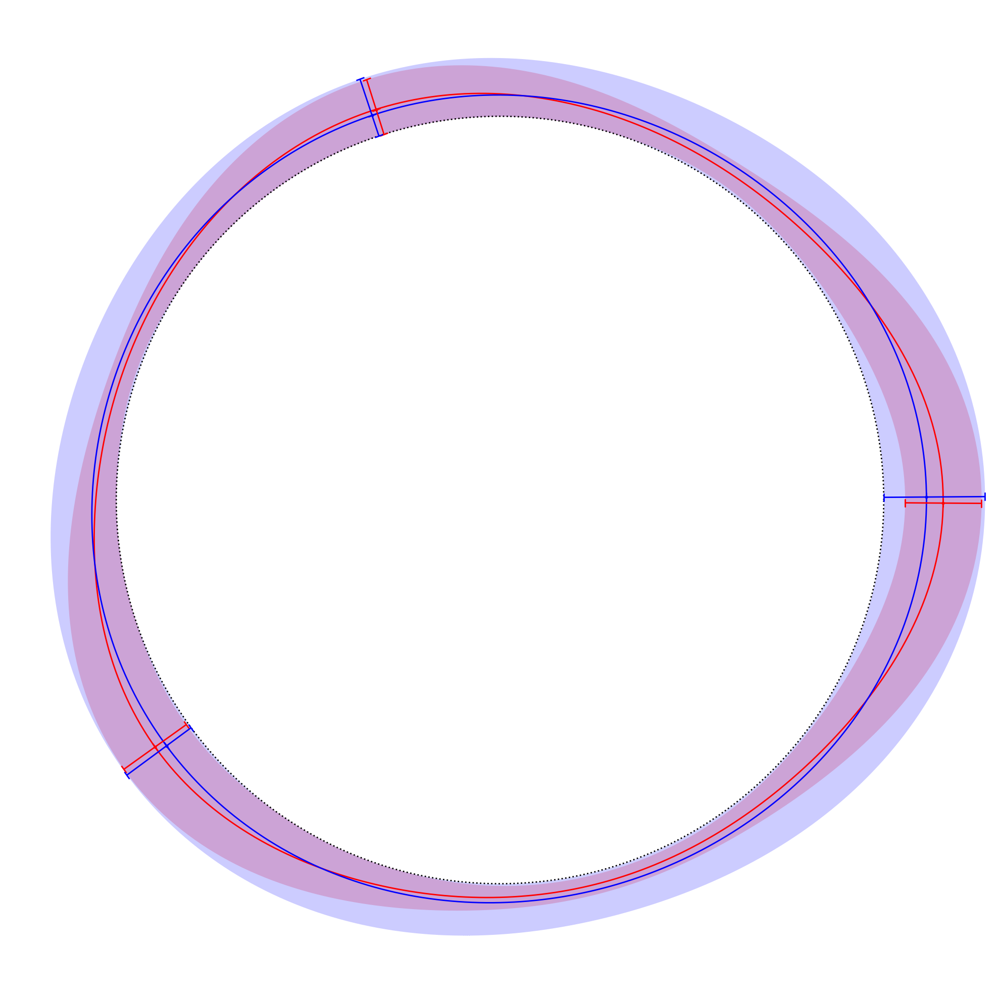

In [239]:
oris = np.linspace(0,180,361)
suboris = np.array([0,54,108])
base_r = 500

def gauss(x,b,p,s2):
    s = np.sqrt(s2)
    return b + 0.99*(p-b)*dmft.basesubwrapnorm(x,s) + 0.3*(p-b)*dmft.basesubwrapnorm(x-54,s) +\
        0.6*(p-b)*dmft.basesubwrapnorm(x-108,s)

size = 10
fig,ax = plt.subplots(1,1,figsize=(1*size,1*size),dpi=200,subplot_kw={'projection': 'polar'})

rE = gauss(oris,rb[0],rp[0],(0.7*sr[0])**2)
rI = gauss(oris,rb[1],rp[1],(0.7*sr[1])**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],(0.7*sCr[0])**2)-\
    gauss(oris,rb[0],rp[0],(0.7*sr[0])**2)**2)
sigrI = np.sqrt(gauss(oris,Crb[1],Crp[1],(0.7*sCr[1])**2)-\
    gauss(oris,rb[1],rp[1],(0.7*sr[1])**2)**2)
subrE = gauss(suboris,rb[0],rp[0],(0.7*sr[0])**2)
subrI = gauss(suboris,rb[1],rp[1],(0.7*sr[1])**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],(0.7*sCr[0])**2)-\
    gauss(suboris,rb[0],rp[0],(0.7*sr[0])**2)**2)
subsigrI = np.sqrt(gauss(suboris,Crb[1],Crp[1],(0.7*sCr[1])**2)-\
    gauss(suboris,rb[1],rp[1],(0.7*sr[1])**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=1)
ax.plot(oris*2*np.pi/180,base_r+rI,'b',lw=1)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
ax.fill_between(oris*2*np.pi/180,base_r+rI+sigrI,base_r+np.fmax(0,rI-sigrI),color='b',lw=0,alpha=0.2)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=1)
ax.scatter((suboris-0.2)*2*np.pi/180,base_r+subrE,s=5,c='r',lw=0,zorder=4)
ax.scatter((suboris+0.2)*2*np.pi/180,base_r+subrI,s=5,c='b',lw=0,zorder=4)
ax.errorbar((suboris-0.2)*2*np.pi/180,base_r+subrE,np.fmin(subrE,subsigrE),lolims=False,uplims=True,
    c='r',ls='none',capsize=3,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris-0.2)*2*np.pi/180,base_r+subrE,subsigrE,lolims=True,uplims=False,
    c='r',ls='none',capsize=3,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.2)*2*np.pi/180,base_r+subrI,np.fmin(subrI,subsigrI),lolims=False,uplims=True,
    c='b',ls='none',capsize=3,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.2)*2*np.pi/180,base_r+subrI,subsigrI,lolims=True,uplims=False,
    c='b',ls='none',capsize=3,lw=1,capthick=1,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_rate_polar_stats_full.pdf')

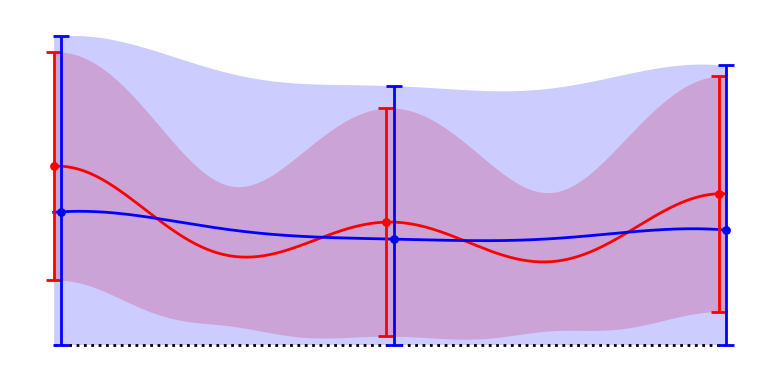

In [275]:
oris = np.linspace(-0.5,90.5,361)
suboris = np.array([0,45,90])
base_r = 500

def gauss(x,b,p,s2):
    s = np.sqrt(s2)
    return b + 0.99*(p-b)*dmft.basesubwrapnorm(x,s) + 0.6*(p-b)*dmft.basesubwrapnorm(x-45,s) +\
        0.8*(p-b)*dmft.basesubwrapnorm(x-90,s)

size = 2
fig,ax = plt.subplots(1,1,figsize=(2*size,1*size),dpi=200)

rE = gauss(oris,rb[0],rp[0],(0.8*sr[0])**2)
rI = gauss(oris,rb[1],rp[1],(0.8*sr[1])**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],(0.8*sCr[0])**2)-\
    gauss(oris,rb[0],rp[0],(0.8*sr[0])**2)**2)
sigrI = np.sqrt(gauss(oris,Crb[1],Crp[1],(0.8*sCr[1])**2)-\
    gauss(oris,rb[1],rp[1],(0.8*sr[1])**2)**2)
subrE = gauss(suboris,rb[0],rp[0],(0.8*sr[0])**2)
subrI = gauss(suboris,rb[1],rp[1],(0.8*sr[1])**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],(0.8*sCr[0])**2)-\
    gauss(suboris,rb[0],rp[0],(0.8*sr[0])**2)**2)
subsigrI = np.sqrt(gauss(suboris,Crb[1],Crp[1],(0.8*sCr[1])**2)-\
    gauss(suboris,rb[1],rp[1],(0.8*sr[1])**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=1)
ax.plot(oris*2*np.pi/180,base_r+rI,'b',lw=1)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
ax.fill_between(oris*2*np.pi/180,base_r+rI+sigrI,base_r+np.fmax(0,rI-sigrI),color='b',lw=0,alpha=0.2)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=1)
ax.scatter((suboris-0.5)*2*np.pi/180,base_r+subrE,s=10,c='r',lw=0,zorder=4)
ax.scatter((suboris+0.5)*2*np.pi/180,base_r+subrI,s=10,c='b',lw=0,zorder=4)
ax.errorbar((suboris-0.5)*2*np.pi/180,base_r+subrE,[np.fmin(subrE,subsigrE),subsigrE],
    c='r',ls='none',capsize=3,lw=1,capthick=1,zorder=4)
ax.errorbar((suboris+0.5)*2*np.pi/180,base_r+subrI,[np.fmin(subrI,subsigrI),subsigrI],
    c='b',ls='none',capsize=3,lw=1,capthick=1,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

fig.tight_layout()
fig.savefig('./../plots/ring_rate_stats_full.pdf')

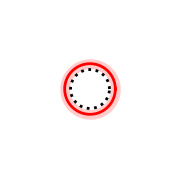

In [38]:
oris = np.linspace(0,180,361)
suboris = np.array([0,18,45,72,90])
base_r = 50

def gauss(x,b,p,s2):
    s = np.sqrt(s2)
    return b*np.ones_like(x)

size = 1
fig,ax = plt.subplots(1,1,figsize=(1*size,1*size),dpi=200,subplot_kw={'projection': 'polar'})

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=size)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+rE-sigrE,color='r',lw=0,alpha=0.2)
# ax.set_xlim(-1,181)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_rmax(base_r+130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_polar_stats_baseline.pdf')

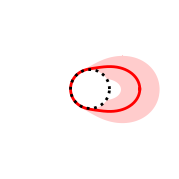

In [42]:
oris = np.linspace(0,180,361)
suboris = np.array([0,18,45,72,90])
base_r = 50

def gauss(x,b,p,s2):
    s = np.sqrt(s2)
    return p*dmft.basesubwrapnorm(x,s)

size = 1
fig,ax = plt.subplots(1,1,figsize=(1*size,1*size),dpi=200,subplot_kw={'projection': 'polar'})

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=size)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
# ax.set_xlim(-1,181)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_rmax(base_r+130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_polar_stats_peak_one.pdf')

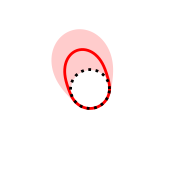

In [46]:
oris = np.linspace(0,180,361)
suboris = np.array([0,18,45,72,90])
base_r = 50

def gauss(x,b,p,s2):
    s = np.sqrt(s2)
    return 0.7*p*dmft.basesubwrapnorm(x-54,s)

size = 1
fig,ax = plt.subplots(1,1,figsize=(1*size,1*size),dpi=200,subplot_kw={'projection': 'polar'})

rE = gauss(oris,rb[0],rp[0],sr[0]**2)
sigrE = np.sqrt(gauss(oris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(oris,rb[0],rp[0],sr[0]**2)**2)
subrE = gauss(suboris,rb[0],rp[0],sr[0]**2)
subsigrE = np.sqrt(gauss(suboris,Crb[0],Crp[0],sCr[0]**2)-\
    gauss(suboris,rb[0],rp[0],sr[0]**2)**2)
ax.plot(oris*2*np.pi/180,base_r+rE,'r',lw=size)
ax.fill_between(oris*2*np.pi/180,base_r+rE+sigrE,base_r+np.fmax(0,rE-sigrE),color='r',lw=0,alpha=0.2)
# ax.set_xlim(-1,181)
# ax.set_ylim(-1,1.01*(rp[0]+np.sqrt(Crp[0]-rp[0]**2)))
# ax.axvline(0,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(18,c='k',ls=(0,(7,5)),lw=size)
# ax.axvline(90,c='k',ls=(0,(7,5)),lw=size)
ax.plot(oris*2*np.pi/180,base_r*np.ones_like(oris),c='k',ls=':',lw=size)
# ax.scatter(suboris,subrE,s=5*size,c='r',lw=0,zorder=4)
# ax.errorbar(suboris,subrE,subsigrE,c='r',ls='none',capsize=size,lw=size,capthick=size,zorder=4)

ax.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
ax.axis('off')

ax.set_rmax(base_r+130)

fig.tight_layout()
fig.savefig('./../plots/ring_rate_polar_stats_peak_two.pdf')

# Code for manually placing objects on ring

In [5]:
cx = 910-70
cy = 505-70
r = 500
nori = 20

print(np.row_stack((cx + r*np.cos((np.arange(nori)-2)/nori*2*np.pi),cy + r*np.sin((np.arange(nori)-2)/nori*2*np.pi))))

[[1244.50849719 1315.52825815 1340.         1315.52825815 1244.50849719
  1133.89262615  994.50849719  840.          685.49150281  546.10737385
   435.49150281  364.47174185  340.          364.47174185  435.49150281
   546.10737385  685.49150281  840.          994.50849719 1133.89262615]
 [ 141.10737385  280.49150281  435.          589.50849719  728.89262615
   839.50849719  910.52825815  935.          910.52825815  839.50849719
   728.89262615  589.50849719  435.          280.49150281  141.10737385
    30.49150281  -40.52825815  -65.          -40.52825815   30.49150281]]


In [145]:
print((dmft.struct_fact( 0,np.sqrt(sW**2+sr[None,:]**2),sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,np.sqrt(sW**2+sr[None,:]**2),sr[None,:]))*500).astype(int)/100)
print((dmft.struct_fact(90,np.sqrt(sW**2+sr[None,:]**2),sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact(90,np.sqrt(sW**2+sr[None,:]**2),sr[None,:]))*500).astype(int)/100)

[[2.38 3.09]
 [2.38 3.09]]
[[2.61 1.9 ]
 [2.61 1.9 ]]
[[0.17 0.52]
 [0.17 0.52]]
[[4.82 4.47]
 [4.82 4.47]]


In [211]:
print((dmft.struct_fact( 0,np.sqrt(100*sW**2+sr[None,:]**2),sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,np.sqrt(100*sW**2+sr[None,:]**2),sr[None,:]))*500).astype(int)/100)
print((dmft.struct_fact(90,np.sqrt(100*sW**2+sr[None,:]**2),sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact(90,np.sqrt(100*sW**2+sr[None,:]**2),sr[None,:]))*500).astype(int)/100)

[[1.15 1.74]
 [1.15 1.74]]
[[3.84 3.25]
 [3.84 3.25]]
[[1.15 1.74]
 [1.15 1.74]]
[[3.84 3.25]
 [3.84 3.25]]


In [300]:
print((dmft.struct_fact( 0,sr[None,:],sr[None,:])*1000).astype(int)/100)
print(((1-dmft.struct_fact( 0,sr[None,:],sr[None,:]))*1000).astype(int)/100)
print((dmft.struct_fact(90,sr[None,:],sr[None,:])*100).astype(int)/100)
print(((1-dmft.struct_fact(90,sr[None,:],sr[None,:]))*1000).astype(int)/100)

[[10. 10.]]
[[0. 0.]]
[[0. 0.]]
[[10. 10.]]


In [312]:
print((dmft.struct_fact( 0,np.sqrt(sW**2+(7*sr[None,:])**2),7*sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,np.sqrt(sW**2+(7*sr[None,:])**2),7*sr[None,:]))*500).astype(int)/100)
print((dmft.struct_fact(90,np.sqrt(sW**2+(7*sr[None,:])**2),7*sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact(90,np.sqrt(sW**2+(7*sr[None,:])**2),7*sr[None,:]))*500).astype(int)/100)

[[2.49 2.5 ]
 [2.49 2.5 ]]
[[2.5  2.49]
 [2.5  2.49]]
[[2.49 2.5 ]
 [2.49 2.5 ]]
[[2.5  2.49]
 [2.5  2.49]]


In [135]:
print((dmft.struct_fact( 0,sW,0.02)*1000).astype(int)/100)
print(((1-dmft.struct_fact( 0,sW,0.02))*1000).astype(int)/100)
print((dmft.struct_fact(90,sW,0.02)*100).astype(int)/100)
print(((1-dmft.struct_fact(90,sW,0.02))*1000).astype(int)/100)

[[0. 0.]
 [0. 0.]]
[[9.99 9.99]
 [9.99 9.99]]
[[0. 0.]
 [0. 0.]]
[[9.99 9.99]
 [9.99 9.99]]


In [310]:
print((dmft.struct_fact( 0,np.sqrt(sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,np.sqrt(sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:]))*500).astype(int)/100)
print((dmft.struct_fact(90,np.sqrt(sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact(90,np.sqrt(sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:]))*500).astype(int)/100)

[[0. 0.]
 [0. 0.]]
[[4.99 4.99]
 [4.99 4.99]]
[[0. 0.]
 [0. 0.]]
[[4.99 4.99]
 [4.99 4.99]]


In [311]:
print((dmft.struct_fact( 0,np.sqrt(100*sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,np.sqrt(100*sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:]))*500).astype(int)/100)
print((dmft.struct_fact(90,np.sqrt(100*sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact(90,np.sqrt(100*sW**2+(0.001*sr[None,:])**2),0.001*sr[None,:]))*500).astype(int)/100)

[[0. 0.]
 [0. 0.]]
[[4.99 4.99]
 [4.99 4.99]]
[[0. 0.]
 [0. 0.]]
[[4.99 4.99]
 [4.99 4.99]]


In [141]:
print(50+50*dmft.basesubwrapnorm(np.arange(10)*90/10,SoriF))
print(50-50*dmft.basesubwrapnorm(np.arange(10)*90/10,SoriF))

[100.          95.89784832  85.50183526  73.13723246  62.70211308
  55.87013279  52.27839364  50.73617372  50.19027307  50.03122775]
[ 0.          4.10215168 14.49816474 26.86276754 37.29788692 44.12986721
 47.72160636 49.26382628 49.80972693 49.96877225]


In [143]:
print((dmft.basesubwrapnorm(np.arange(10)*90/10,SoriE)*500).astype(int)/100)
print((dmft.basesubwrapnorm(np.arange(10)*90/10,SoriI)*500).astype(int)/100)

[5.   4.78 4.18 3.35 2.44 1.61 0.95 0.49 0.19 0.04]
[5.   4.79 4.23 3.44 2.56 1.73 1.05 0.55 0.23 0.05]


In [273]:
print(np.vstack([np.round(50+50*(0.98*dmft.basesubwrapnorm(np.arange(20)*180/20,0.8*SoriF)+\
             0.6*dmft.basesubwrapnorm(np.arange(20)*180/20-45,0.8*SoriF)+\
             0.8*dmft.basesubwrapnorm(np.arange(20)*180/20-90,0.8*SoriF))).astype(int),
                 np.round(50-50*(0.98*dmft.basesubwrapnorm(np.arange(20)*180/20,0.8*SoriF)+\
             0.6*dmft.basesubwrapnorm(np.arange(20)*180/20-45,0.8*SoriF)+\
             0.8*dmft.basesubwrapnorm(np.arange(20)*180/20-90,0.8*SoriF))).astype(int)]))

[[100  96  88  82  82  83  81  80  82  89  91  85  73  62  55  53  56  65
   79  93]
 [  0   4  12  18  18  17  19  20  18  11   9  15  27  38  45  47  44  35
   21   7]]


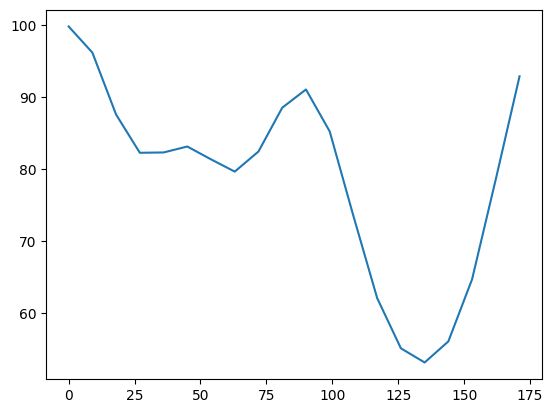

In [271]:
plt.plot(np.arange(20)*180/20,50+50*(0.975*dmft.basesubwrapnorm(np.arange(20)*180/20,0.8*SoriF)+\
             0.6*dmft.basesubwrapnorm(np.arange(20)*180/20-45,0.8*SoriF)+\
             0.8*dmft.basesubwrapnorm(np.arange(20)*180/20-90,0.8*SoriF)))

In [197]:
print((dmft.struct_fact( 54,0.7*np.sqrt(sW**2+sr[None,:]**2),0.7*sr[None,:])*500).astype(int)/100)
print((dmft.struct_fact( 72,0.7*np.sqrt(sW**2+sr[None,:]**2),0.7*sr[None,:])*500).astype(int)/100)
print((dmft.struct_fact(  0,0.7*np.sqrt(sW**2+sr[None,:]**2),0.7*sr[None,:])*500).astype(int)/100)

[[0.2  0.51]
 [0.2  0.51]]
[[0.03 0.13]
 [0.03 0.13]]
[[2.38 3.09]
 [2.38 3.09]]


In [274]:
print(((1-dmft.struct_fact( 0,0.8*np.sqrt(sW**2+sr[None,:]**2),0.8*sr[None,:])-2*dmft.struct_fact(45,0.8*np.sqrt(sW**2+sr[None,:]**2),0.8*sr[None,:]))*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,0.8*np.sqrt(sW**2+sr[None,:]**2),0.8*sr[None,:])-dmft.struct_fact(45,0.8*np.sqrt(sW**2+sr[None,:]**2),0.8*sr[None,:])-dmft.struct_fact(90,0.8*np.sqrt(sW**2+sr[None,:]**2),0.8*sr[None,:]))*500).astype(int)/100)
print(((1-3*dmft.struct_fact(90,0.8*np.sqrt(sW**2+sr[None,:]**2),0.8*sr[None,:]))*500).astype(int)/100)

[[ 1.31 -0.49]
 [ 1.31 -0.49]]
[[1.94 0.56]
 [1.94 0.56]]
[[4.91 4.58]
 [4.91 4.58]]


In [205]:
print((dmft.struct_fact(45,np.sqrt(sW**2+sr[None,:]**2),sr[None,:])*500).astype(int)/100)
print((dmft.struct_fact( 0,np.sqrt(sW**2+sr[None,:]**2),sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,np.sqrt(sW**2+sr[None,:]**2),sr[None,:]))*500).astype(int)/100)
print((dmft.struct_fact(90,np.sqrt(sW**2+sr[None,:]**2),sr[None,:])*500).astype(int)/100)
print(((1-2*dmft.struct_fact(90,np.sqrt(sW**2+sr[None,:]**2),sr[None,:]))*500).astype(int)/100)

[[1.04 1.68]
 [1.04 1.68]]
[[2.38 3.09]
 [2.38 3.09]]
[[2.61 1.9 ]
 [2.61 1.9 ]]
[[0.17 0.52]
 [0.17 0.52]]
[[4.65 3.94]
 [4.65 3.94]]


In [207]:
print((dmft.struct_fact(45,sW,0.02)*500).astype(int)/100)
print((dmft.struct_fact( 0,sW,0.02)*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,sW,0.02))*500).astype(int)/100)
print((dmft.struct_fact(90,sW,0.02)*500).astype(int)/100)
print(((1-2*dmft.struct_fact(90,sW,0.02))*500).astype(int)/100)

[[0. 0.]
 [0. 0.]]
[[0. 0.]
 [0. 0.]]
[[4.99 4.99]
 [4.99 4.99]]
[[0. 0.]
 [0. 0.]]
[[4.99 4.99]
 [4.99 4.99]]


In [208]:
print((dmft.struct_fact(45,sr[None,:],sr[None,:])*500).astype(int)/100)
print((dmft.struct_fact( 0,sr[None,:],sr[None,:])*500).astype(int)/100)
print(((1-dmft.struct_fact( 0,sr[None,:],sr[None,:]))*500).astype(int)/100)
print((dmft.struct_fact(90,sr[None,:],sr[None,:])*500).astype(int)/100)
print(((1-2*dmft.struct_fact(90,sr[None,:],sr[None,:]))*500).astype(int)/100)

[[0.12 1.01]]
[[5. 5.]]
[[0. 0.]]
[[0. 0.]]
[[5. 5.]]


In [295]:
xs = np.array([0,45,90])
Oinv = dmft.inv_overlap(xs,0.7*sr[:,None])
pint = dmft.struct_fact(xs[None,None,:,None]-xs[None,None,None,:],
                        0.7*np.sqrt(sW**2+sr[None,:]**2)[:,:,None,None],0.7*sr[None,:,None,None])
bint = dmft.struct_fact(90*np.ones(3)[None,None,:],0.7*np.sqrt(sW**2+sr[None,:]**2)[:,:,None],0.7*sr[None,:,None])
pint = np.einsum('ijkl,jlm->ijkm',pint,Oinv)
bint = np.einsum('ijk,jkm->ijm',bint,Oinv)
print('Z11 = ',(pint[0,:,0,0]*500).astype(int)/100)
print('Z12 = ',(pint[0,:,0,1]*500).astype(int)/100)
print('Z13 = ',(pint[0,:,0,2]*500).astype(int)/100)
print('Z21 = ',(pint[0,:,1,0]*500).astype(int)/100)
print('Z22 = ',(pint[0,:,1,1]*500).astype(int)/100)
print('Z23 = ',(pint[0,:,1,2]*500).astype(int)/100)
print('Z31 = ',(pint[0,:,2,0]*500).astype(int)/100)
print('Z32 = ',(pint[0,:,2,1]*500).astype(int)/100)
print('Z33 = ',(pint[0,:,2,2]*500).astype(int)/100)
print('Zb1 = ',(bint[0,:,0]*500).astype(int)/100)
print('Zb2 = ',(bint[0,:,1]*500).astype(int)/100)
print('Zb3 = ',(bint[0,:,2]*500).astype(int)/100)
print('Z1b = ',((1-pint[0,:,0,:].sum(-1))*500).astype(int)/100)
print('Z2b = ',((1-pint[0,:,1,:].sum(-1))*500).astype(int)/100)
print('Z3b = ',((1-pint[0,:,2,:].sum(-1))*500).astype(int)/100)
print('Zbb = ',((1-bint[0,:,:].sum(-1))*500).astype(int)/100)

Z11 =  [2.38 3.06]
Z12 =  [0.43 0.77]
Z13 =  [0.   0.01]
Z21 =  [0.43 0.77]
Z22 =  [2.38 3.03]
Z23 =  [0.43 0.77]
Z31 =  [0.   0.01]
Z32 =  [0.43 0.77]
Z33 =  [2.38 3.06]
Zb1 =  [0.   0.04]
Zb2 =  [0.   0.04]
Zb3 =  [0.   0.04]
Z1b =  [2.17 1.14]
Z2b =  [1.74 0.4 ]
Z3b =  [2.17 1.14]
Zbb =  [4.98 4.87]


In [325]:
(100/(5*4**(2*np.arange(0,6+1)/6 - 1))).astype(int)

array([80, 50, 31, 20, 12,  7,  5])